In [ ]:
import os
import pickle
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []
    feature_indices_list = []

    # Iterate through each sub-folder in the given folder path
    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path) and sub_folder.startswith('Partition'):
            train_file_path = os.path.join(full_path, 'trnData.p')
            test_file_path = os.path.join(full_path, 'tstData.p')
            features_file_path = os.path.join(full_path, 'SLCE_features.p')

            # Check if all required files exist
            if os.path.exists(train_file_path) and os.path.exists(test_file_path) and os.path.exists(features_file_path):
                # Load train and test data
                train_data = pd.read_pickle(train_file_path)
                test_data = pd.read_pickle(test_file_path)

                # Load features
                features_data = pd.read_pickle(features_file_path)
                feature_indices = features_data[:50].tolist()  # Convert the first 50 elements of the features to a list

                # Append data to lists
                train_data_list.append(train_data)
                test_data_list.append(test_data)
                feature_indices_list.append(feature_indices)

    return train_data_list, test_data_list, feature_indices_list

folder_path = '/content/drive/MyDrive/Data/GLIOMA'
train_data_list, test_data_list, feature_indices_list = load_data_from_folder(folder_path)
mean_acc = []

for i, (train_data, test_data, feature_indices) in enumerate(zip(train_data_list, test_data_list, feature_indices_list)):
    print(f"Partition {i+1} Top 50 Indices: {feature_indices}")

    # Use numpy indexing for features and the last column for the target
    X_train = train_data[:, feature_indices]
    y_train = train_data[:, -1]  # Assuming 'target' column is the last column
    X_test = test_data[:, feature_indices]
    y_test = test_data[:, -1]

    # Create DataFrames for saving to CSV
    train_df = pd.DataFrame(X_train, columns=[f'feature_{idx}' for idx in feature_indices])
    train_df['target'] = y_train
    test_df = pd.DataFrame(X_test, columns=[f'feature_{idx}' for idx in feature_indices])
    test_df['target'] = y_test

    sub_folder_path = os.path.join(folder_path, f'Partition{i}')
    train_df.to_csv(os.path.join(sub_folder_path, 'train_data_slce.csv'), index=False)
    test_df.to_csv(os.path.join(sub_folder_path, 'test_data_slce.csv'), index=False)

    # Train and evaluate the model
    model = RandomForestClassifier(n_estimators=100)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    mean_acc.append(accuracy)
    print(f'Accuracy for Partition {i+1}: {accuracy}')

average_accuracy = sum(mean_acc) / len(mean_acc)
print(f'Mean Accuracy across all partitions: {average_accuracy}')


Partition 1 Top 50 Indices: [1870, 118, 89, 3843, 419, 4423, 996, 202, 628, 4419, 739, 1223, 3337, 486, 4433, 1648, 3686, 3209, 2059, 3384, 3562, 1747, 164, 738, 1755, 4413, 1499, 2870, 4346, 277, 554, 2427, 449, 1907, 2650, 3764, 3353, 2292, 2823, 3693, 2331, 4403, 3435, 2948, 2617, 2500, 3399, 2668, 3712, 3407]
Accuracy for Partition 1: 0.75
Partition 2 Top 50 Indices: [993, 2974, 1870, 969, 4389, 554, 739, 3177, 4279, 3059, 4423, 3843, 4030, 4242, 89, 2851, 469, 118, 738, 4433, 4419, 2608, 3396, 2112, 4422, 543, 3448, 2292, 9, 85, 628, 287, 1809, 3938, 2585, 3422, 3209, 2509, 3092, 3407, 202, 3632, 3044, 3657, 2059, 4117, 4048, 4370, 486, 2119]
Accuracy for Partition 2: 0.7083333333333334
Partition 3 Top 50 Indices: [1870, 738, 118, 4419, 4422, 3896, 739, 554, 4423, 3399, 1896, 1651, 2961, 202, 1142, 1753, 3337, 628, 3843, 2406, 3866, 996, 85, 89, 449, 4030, 2185, 469, 3054, 2394, 4302, 3442, 367, 1454, 2650, 2427, 1325, 4433, 3733, 1532, 3608, 2766, 3562, 2217, 2127, 4281, 1445, 38

Processing /content/drive/MyDrive/Data/GLIOMA/Partition11/train_data_slce.csv


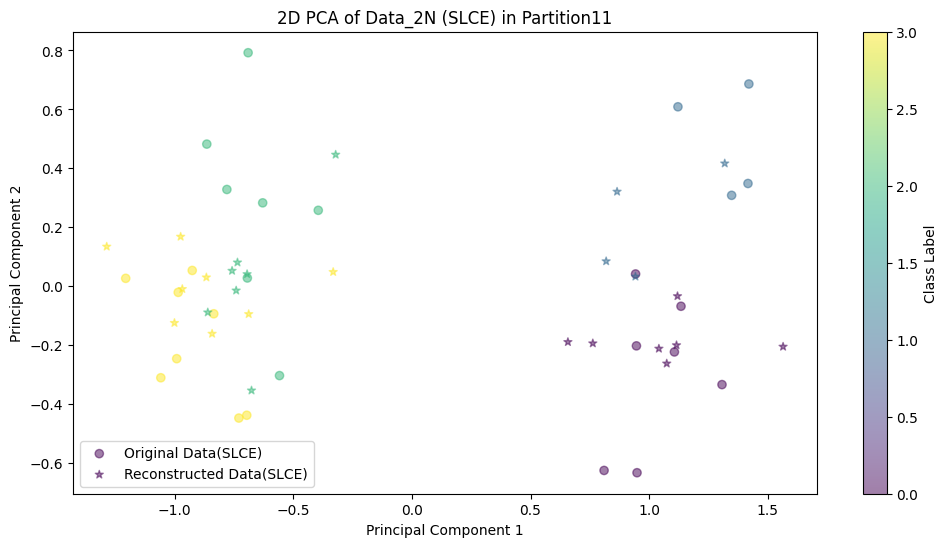

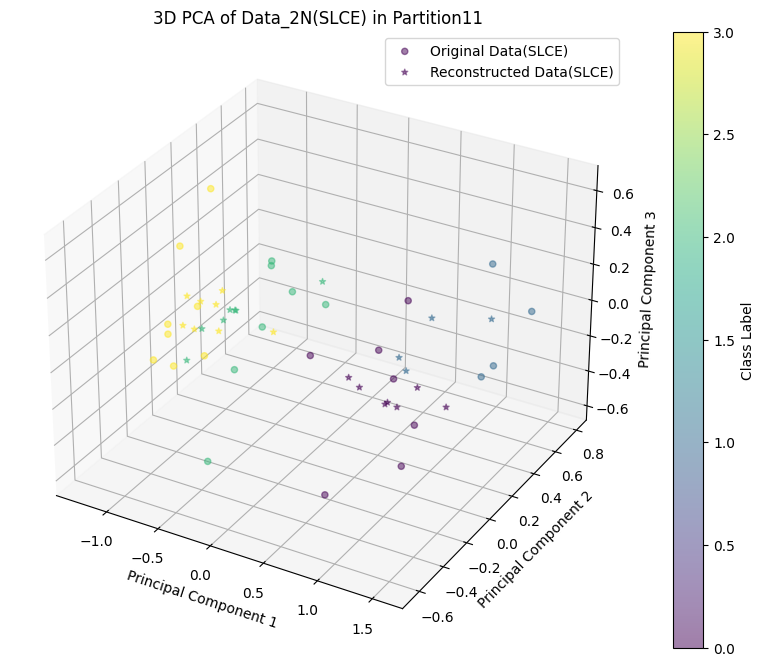

Processing /content/drive/MyDrive/Data/GLIOMA/Partition16/train_data_slce.csv


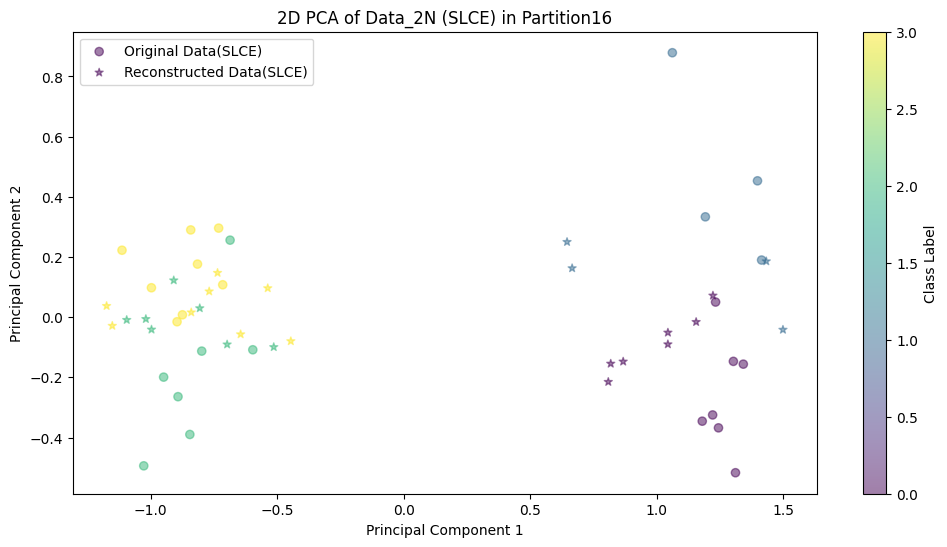

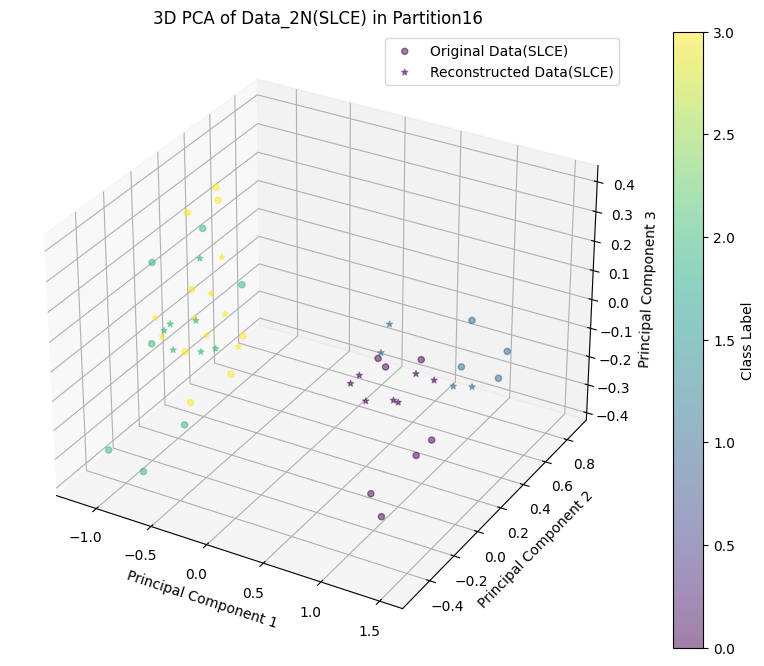

Processing /content/drive/MyDrive/Data/GLIOMA/Partition19/train_data_slce.csv


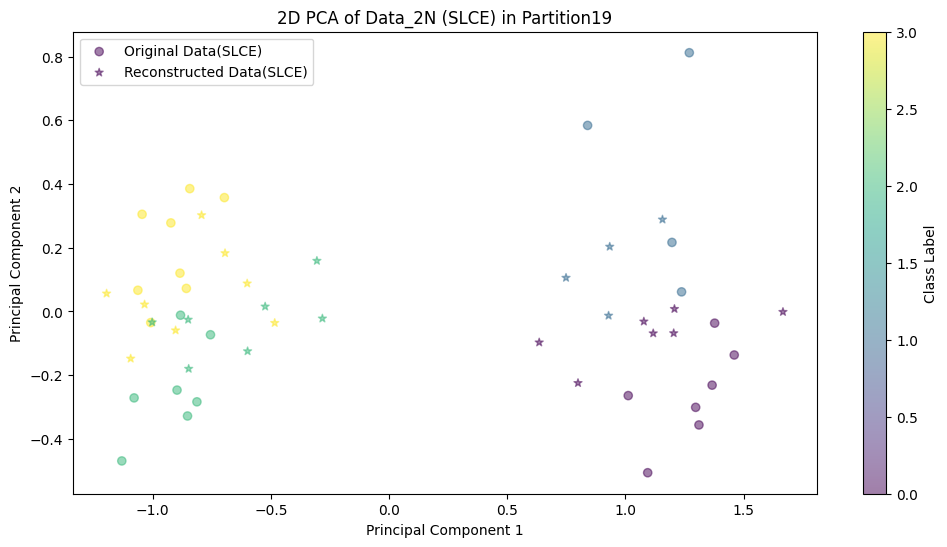

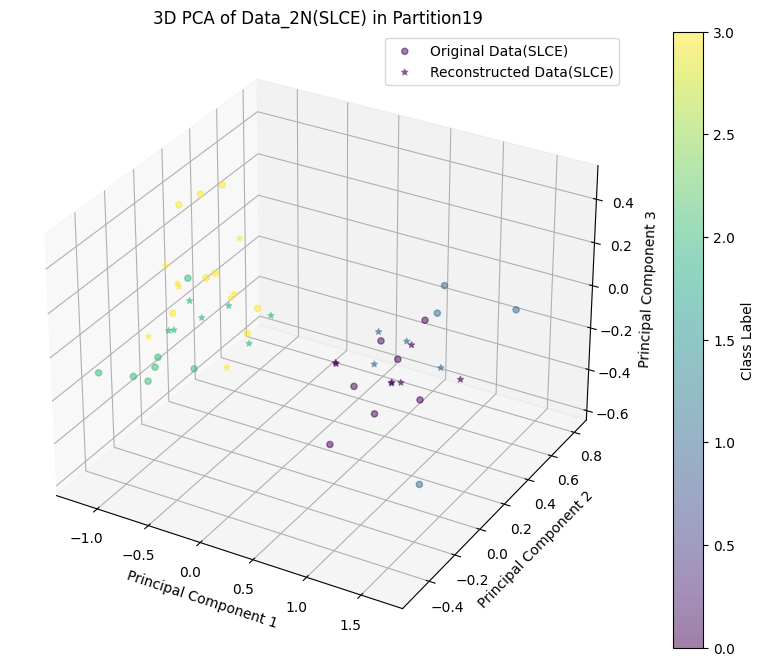

Processing /content/drive/MyDrive/Data/GLIOMA/Partition6/train_data_slce.csv


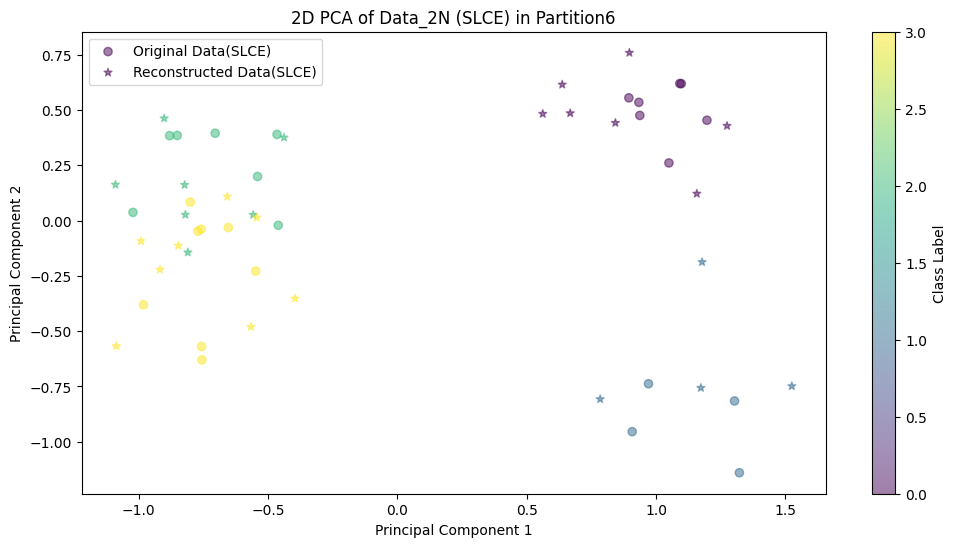

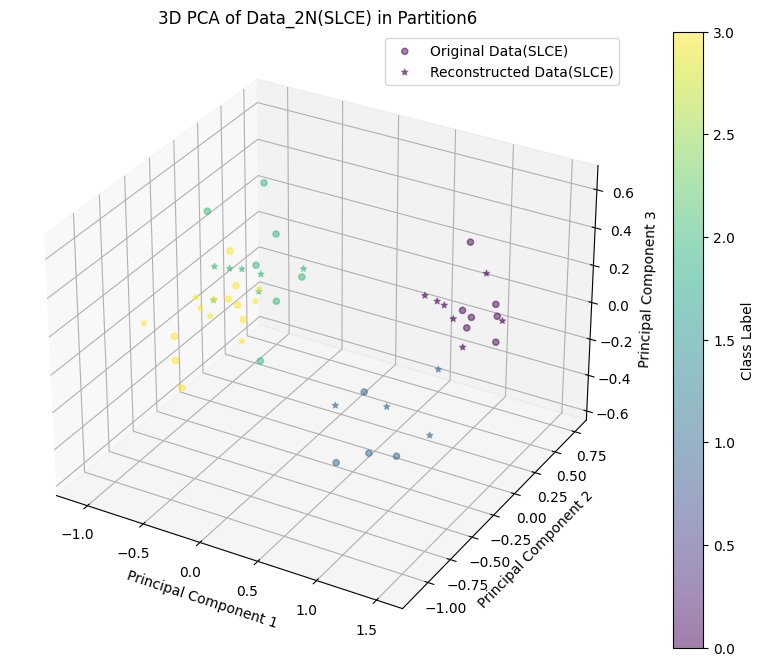

Processing /content/drive/MyDrive/Data/GLIOMA/Partition10/train_data_slce.csv


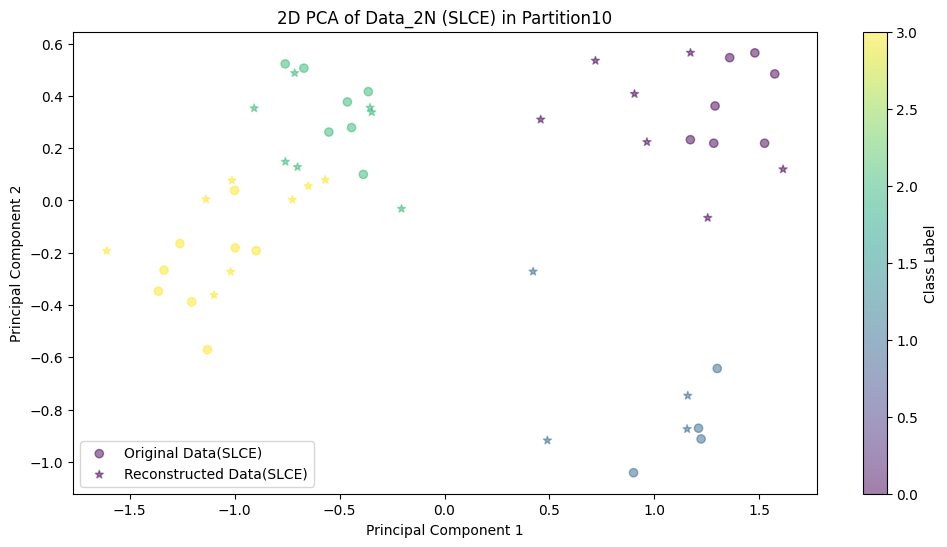

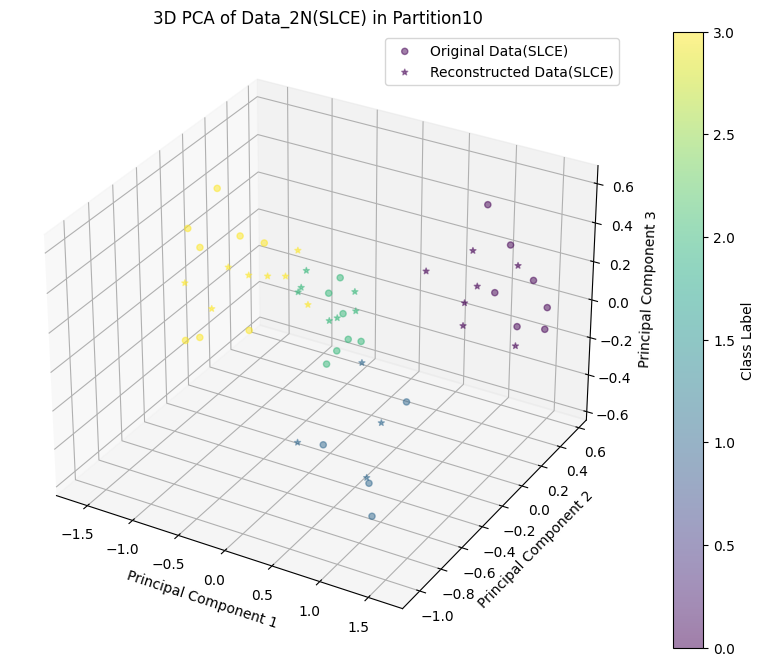

Processing /content/drive/MyDrive/Data/GLIOMA/Partition8/train_data_slce.csv


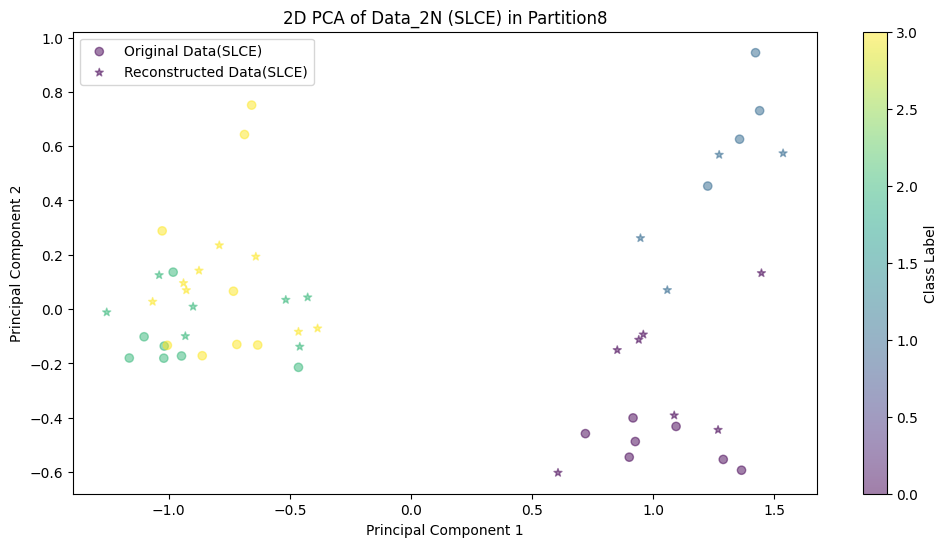

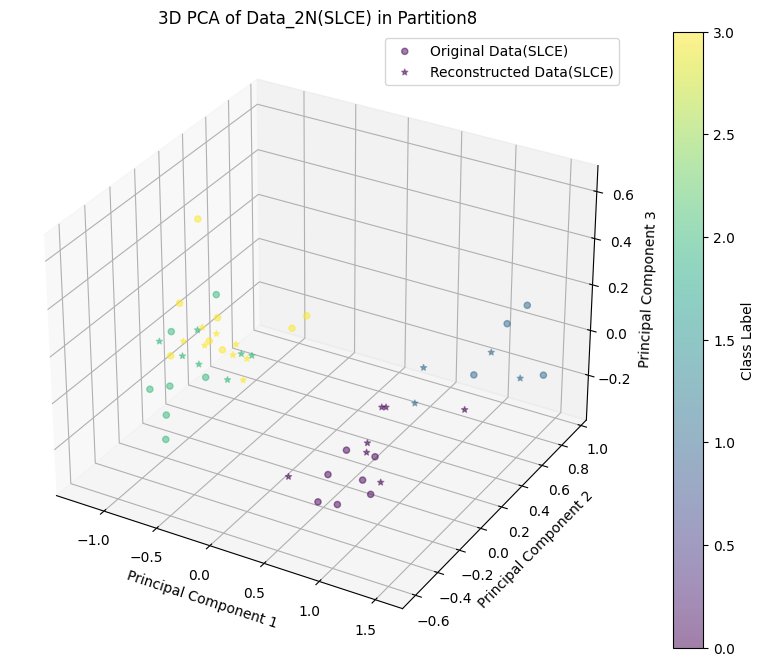

Processing /content/drive/MyDrive/Data/GLIOMA/Partition0/train_data_slce.csv


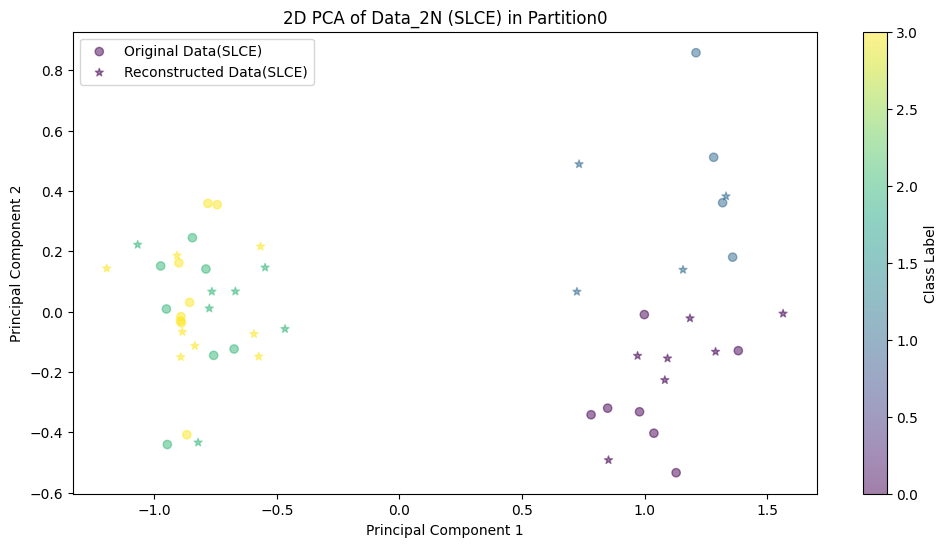

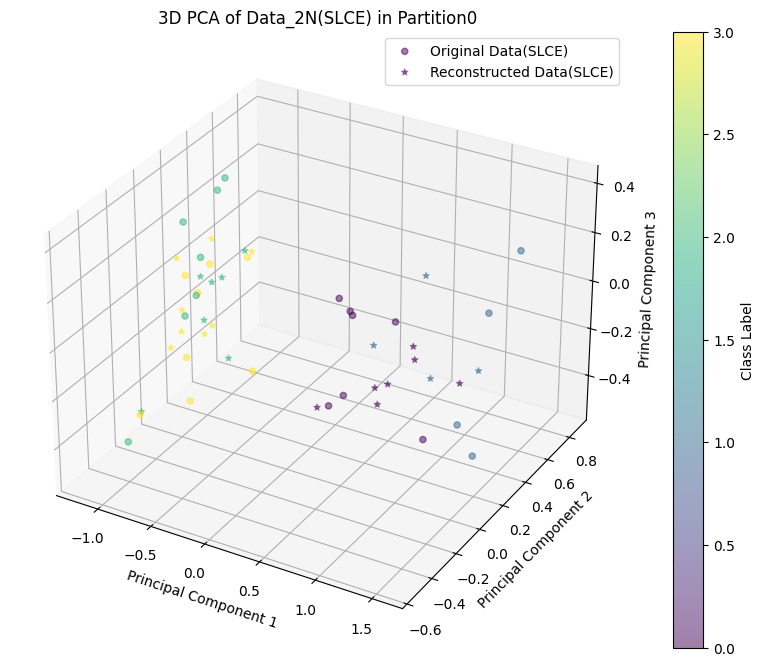

Processing /content/drive/MyDrive/Data/GLIOMA/Partition17/train_data_slce.csv


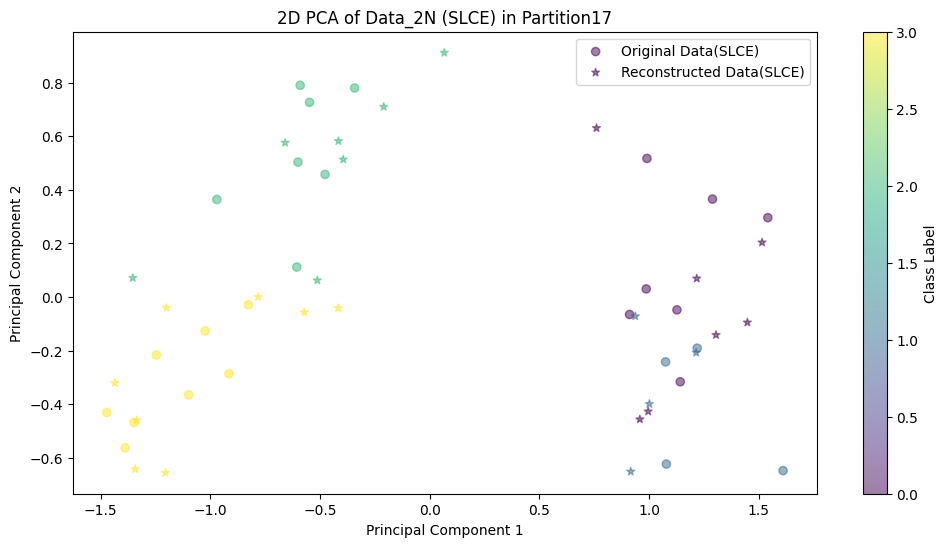

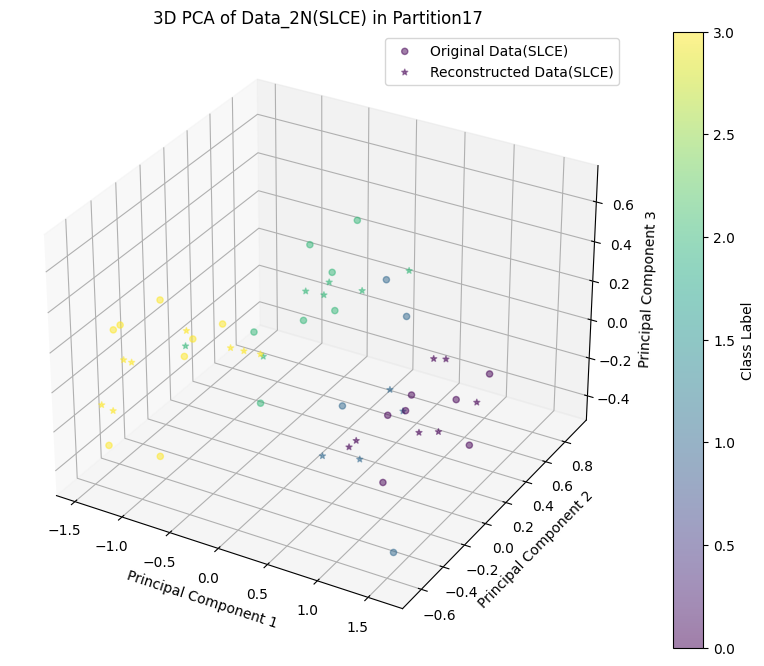

Processing /content/drive/MyDrive/Data/GLIOMA/Partition9/train_data_slce.csv


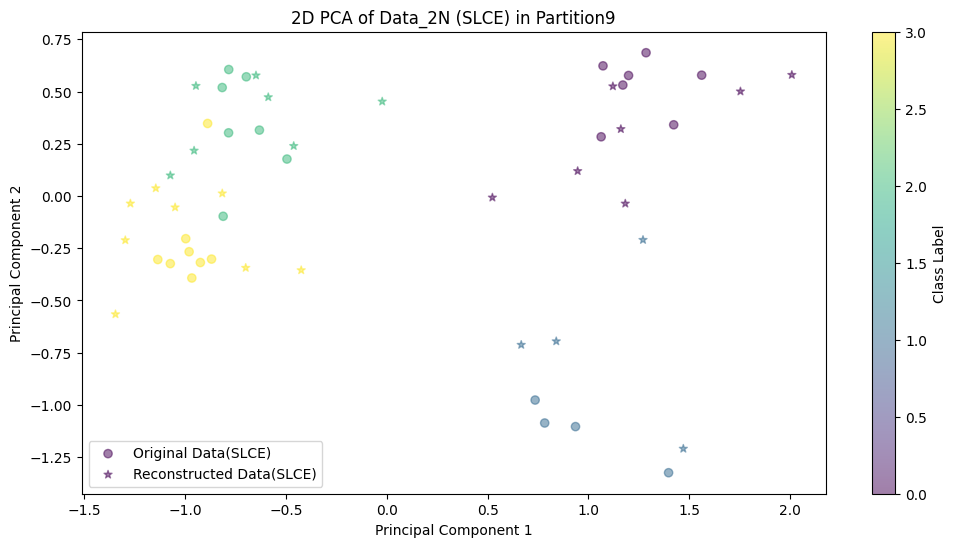

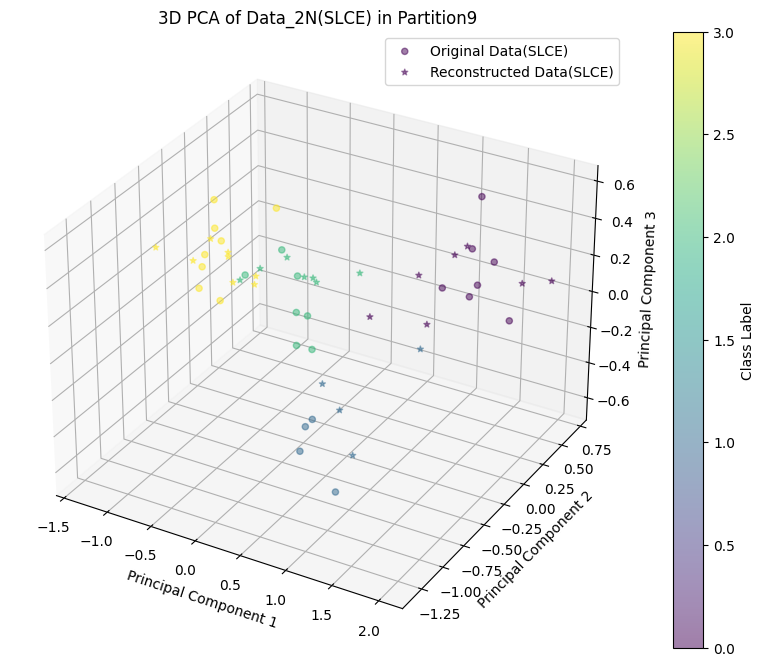

Processing /content/drive/MyDrive/Data/GLIOMA/Partition18/train_data_slce.csv


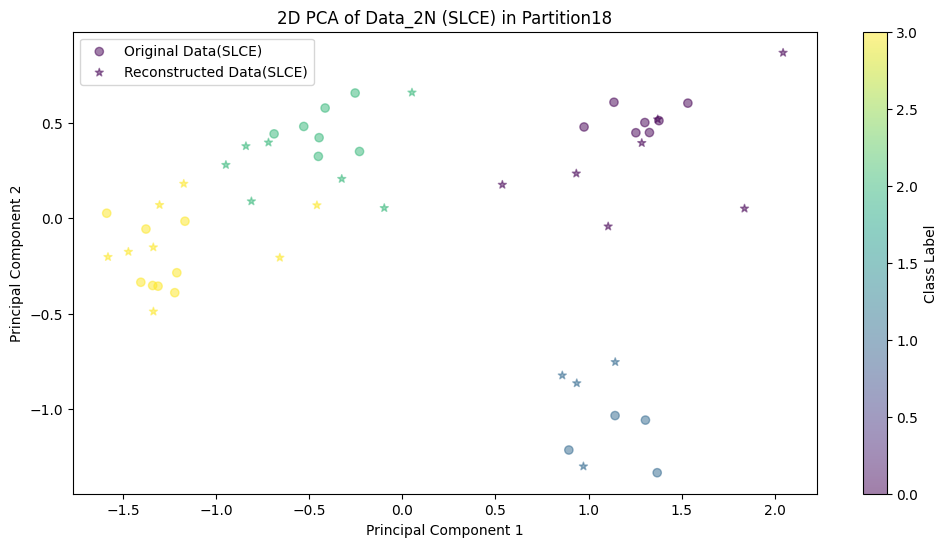

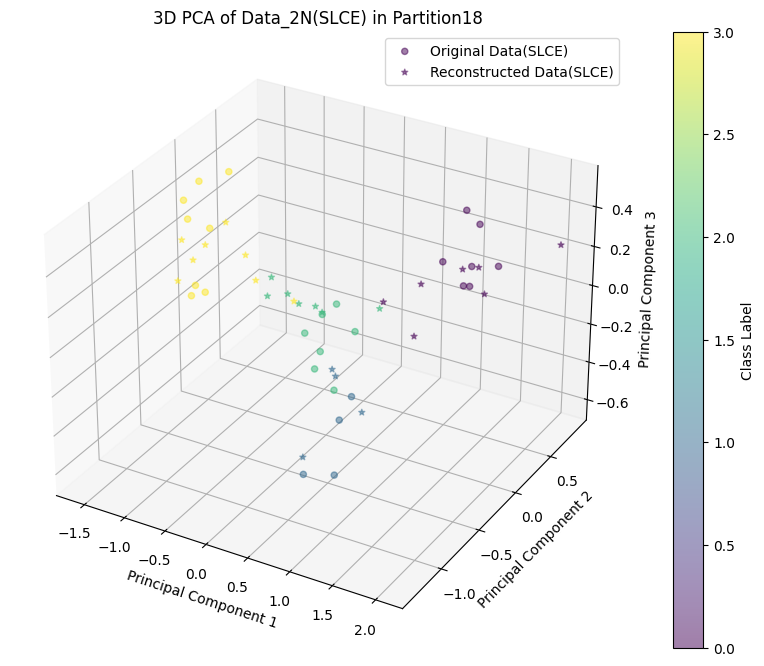

Processing /content/drive/MyDrive/Data/GLIOMA/Partition7/train_data_slce.csv


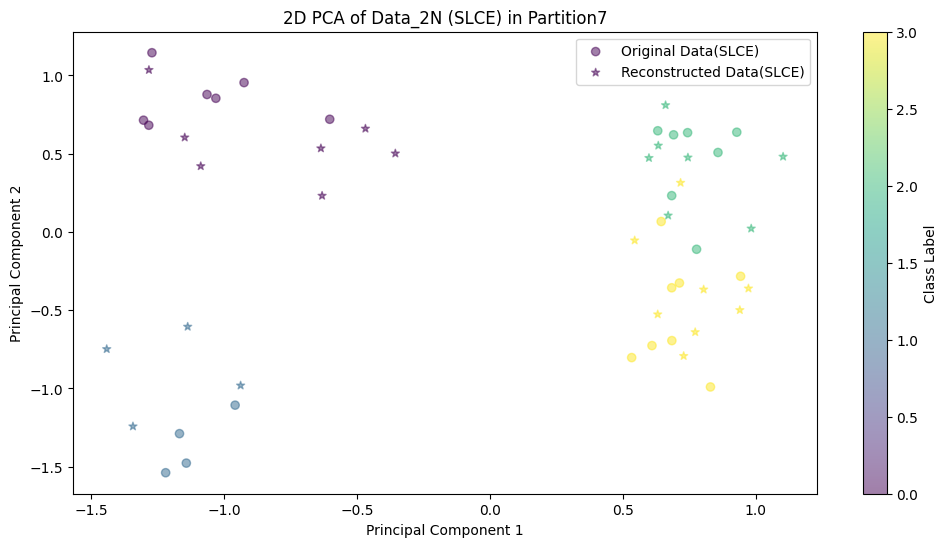

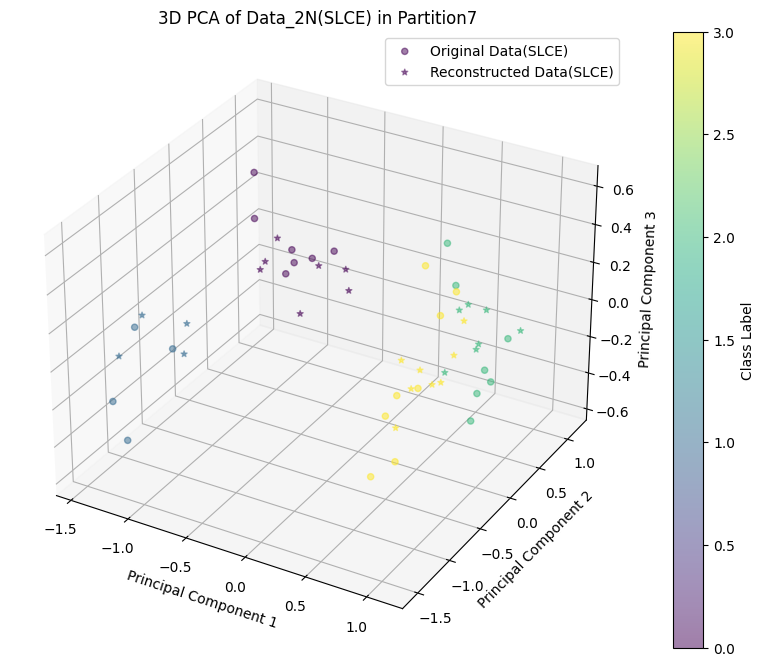

Processing /content/drive/MyDrive/Data/GLIOMA/Partition1/train_data_slce.csv


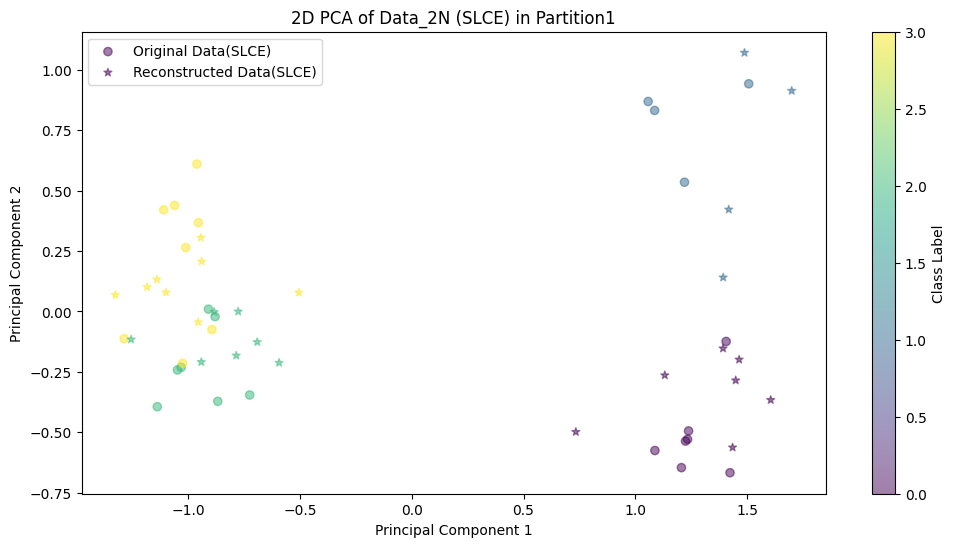

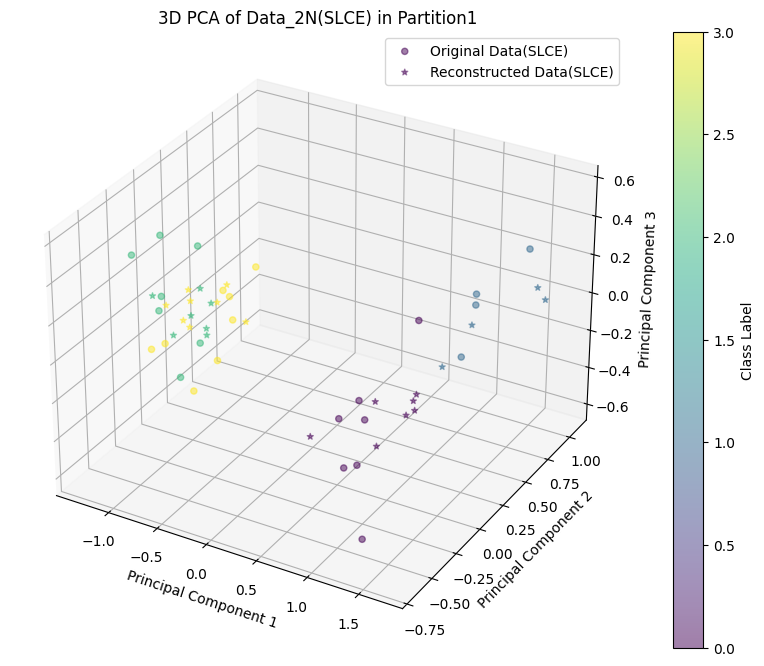

Processing /content/drive/MyDrive/Data/GLIOMA/Partition15/train_data_slce.csv


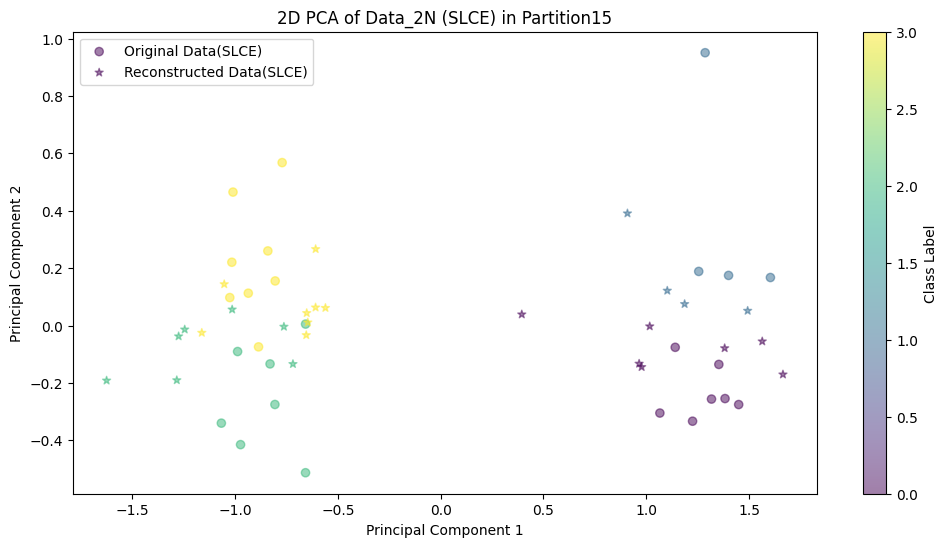

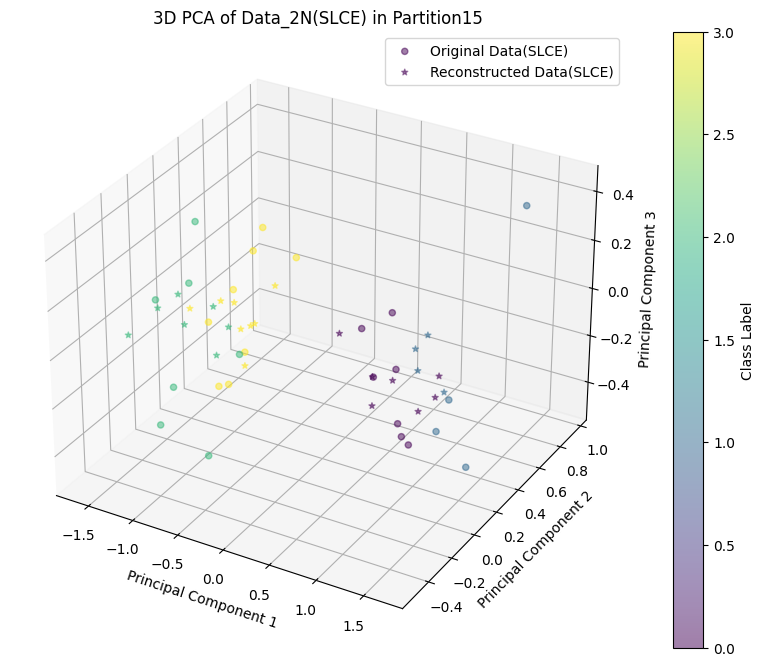

Processing /content/drive/MyDrive/Data/GLIOMA/Partition12/train_data_slce.csv


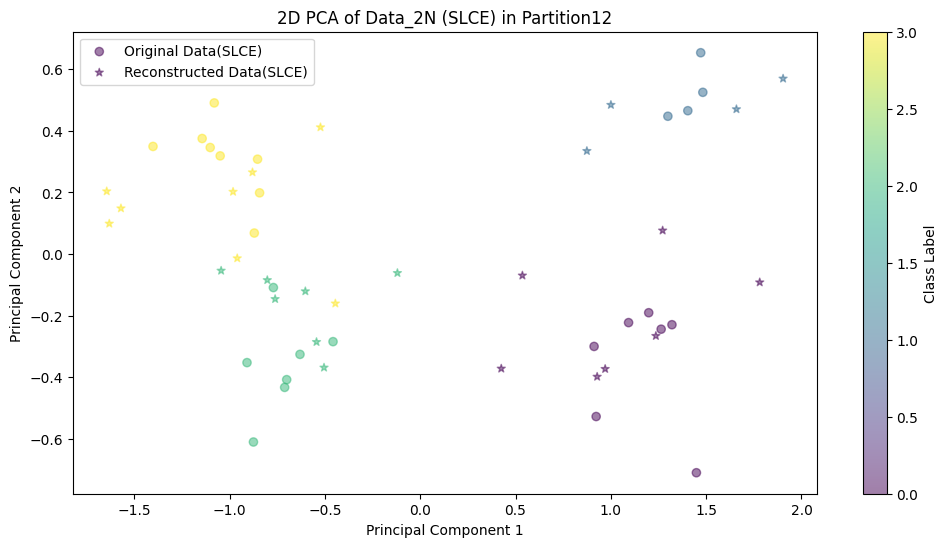

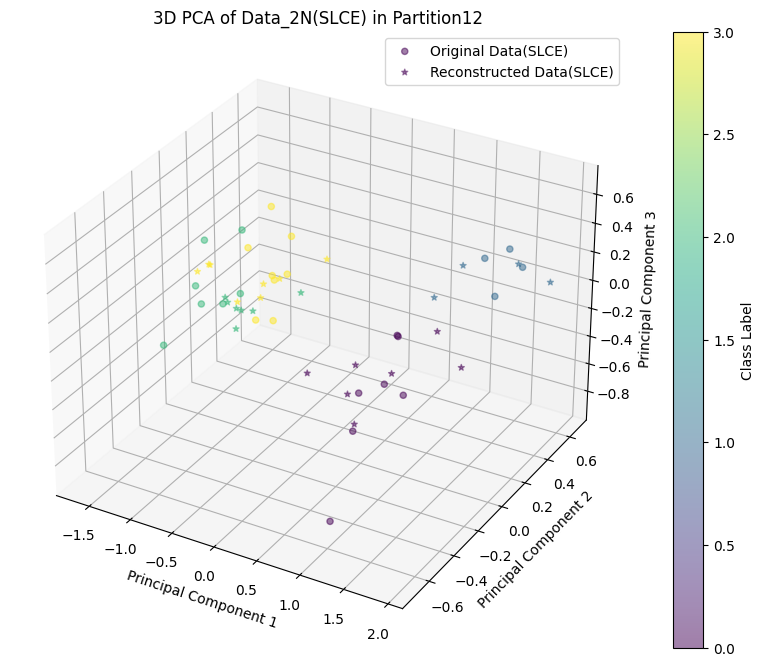

Processing /content/drive/MyDrive/Data/GLIOMA/Partition13/train_data_slce.csv


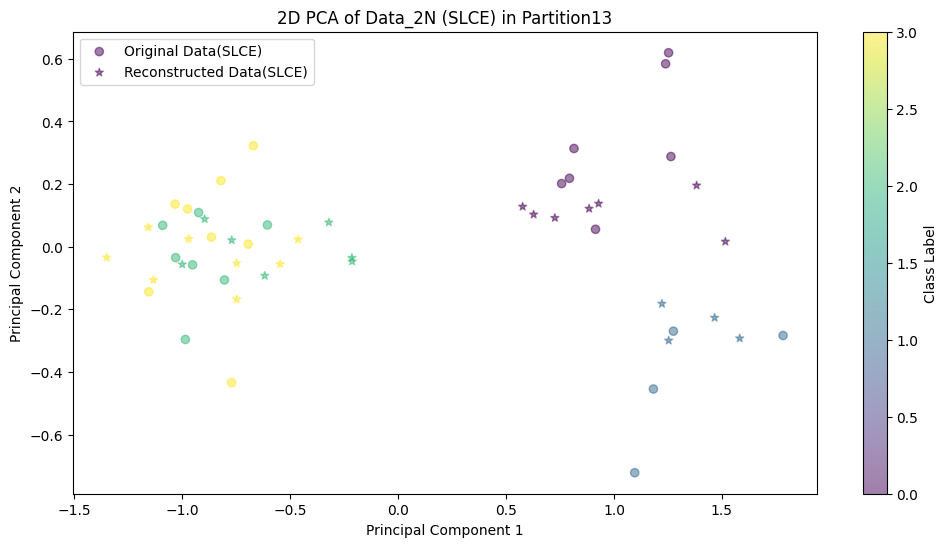

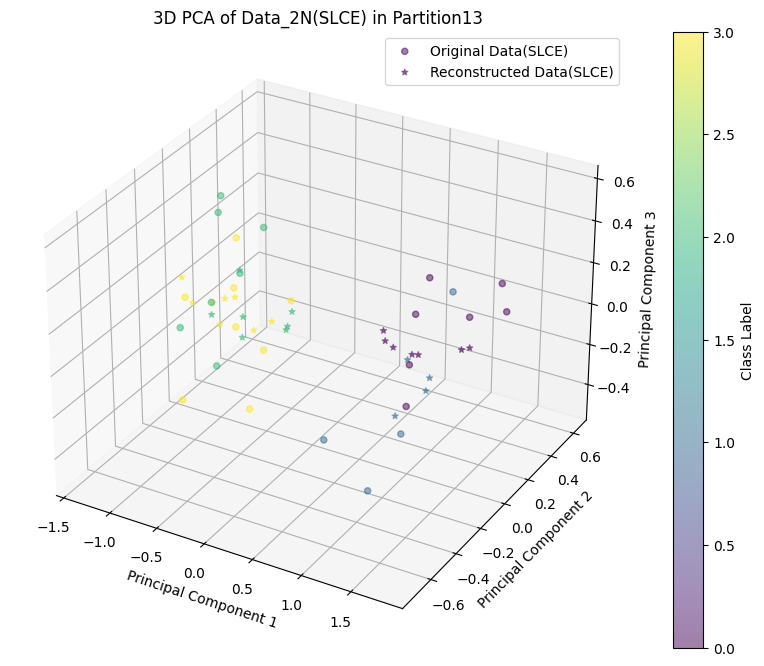

Processing /content/drive/MyDrive/Data/GLIOMA/Partition14/train_data_slce.csv


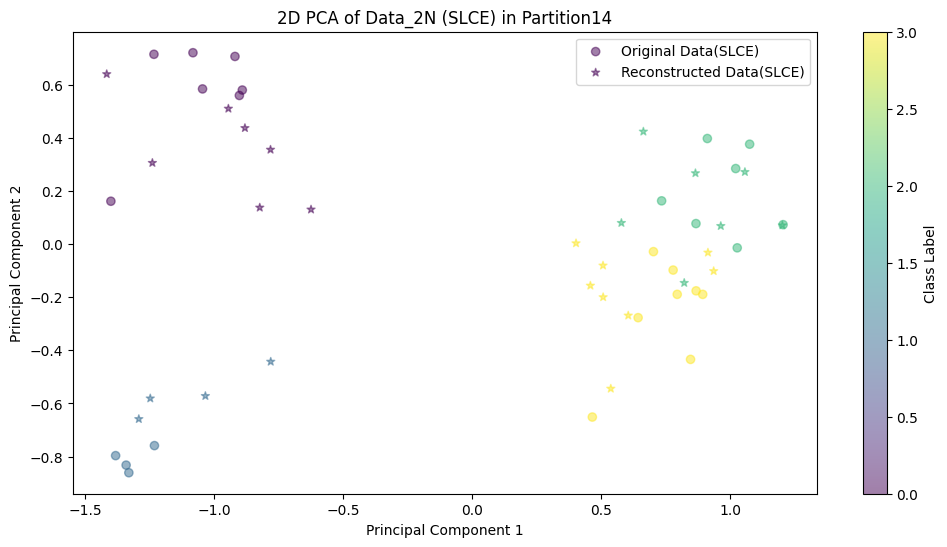

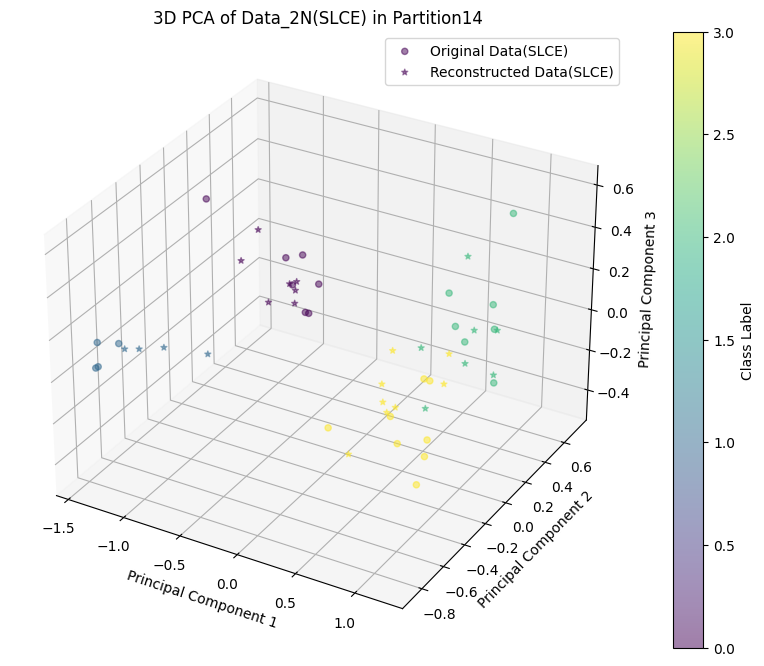

Processing /content/drive/MyDrive/Data/GLIOMA/Partition5/train_data_slce.csv


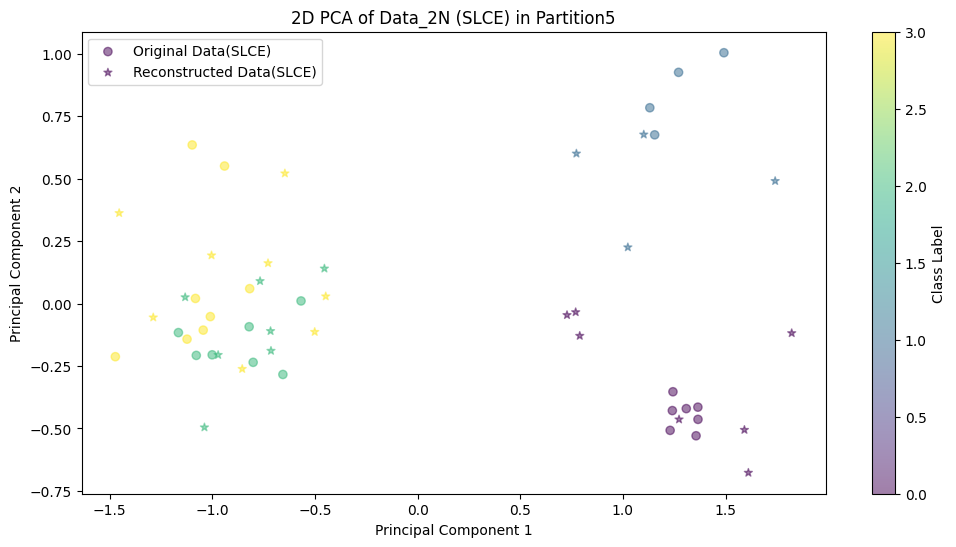

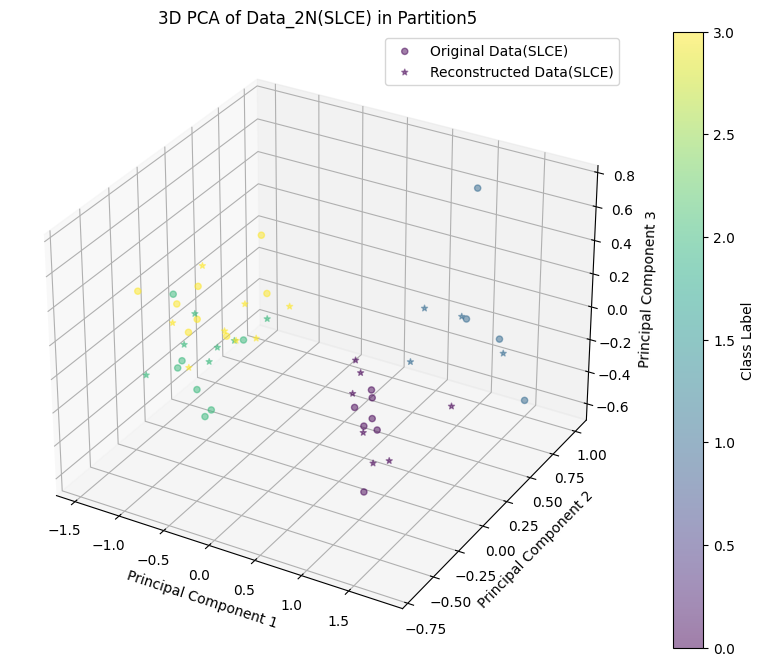

Processing /content/drive/MyDrive/Data/GLIOMA/Partition3/train_data_slce.csv


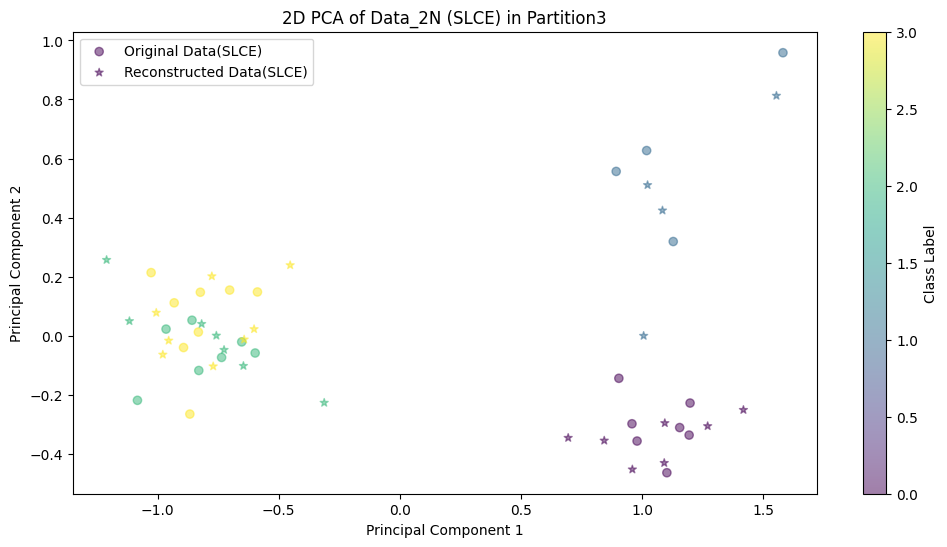

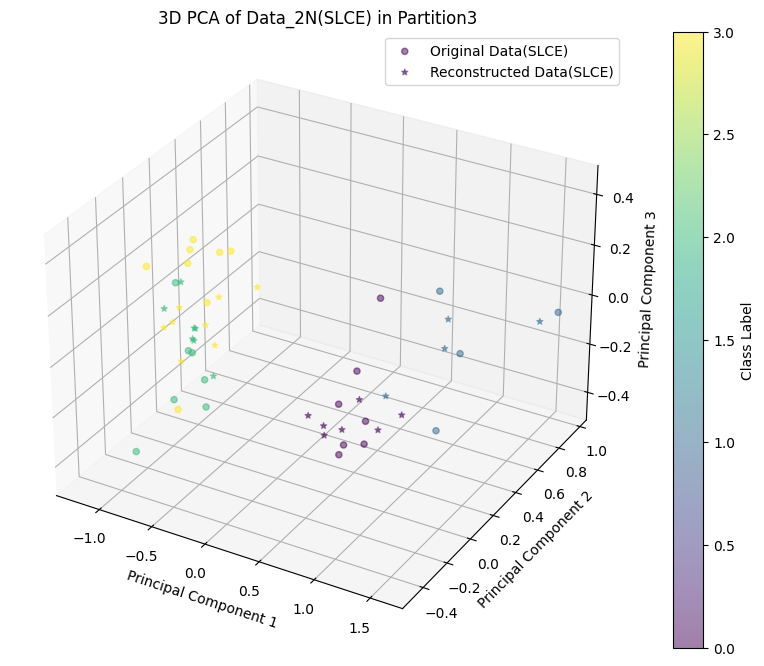

Processing /content/drive/MyDrive/Data/GLIOMA/Partition2/train_data_slce.csv


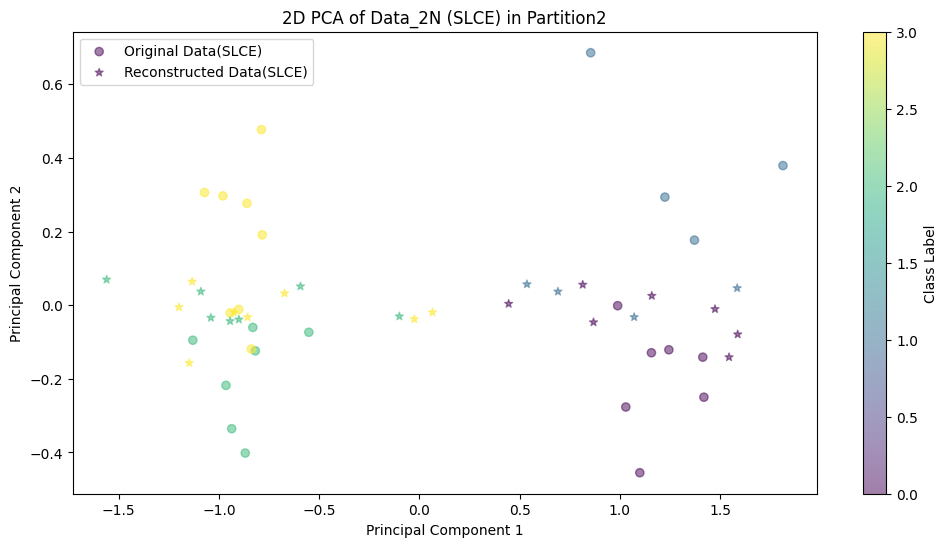

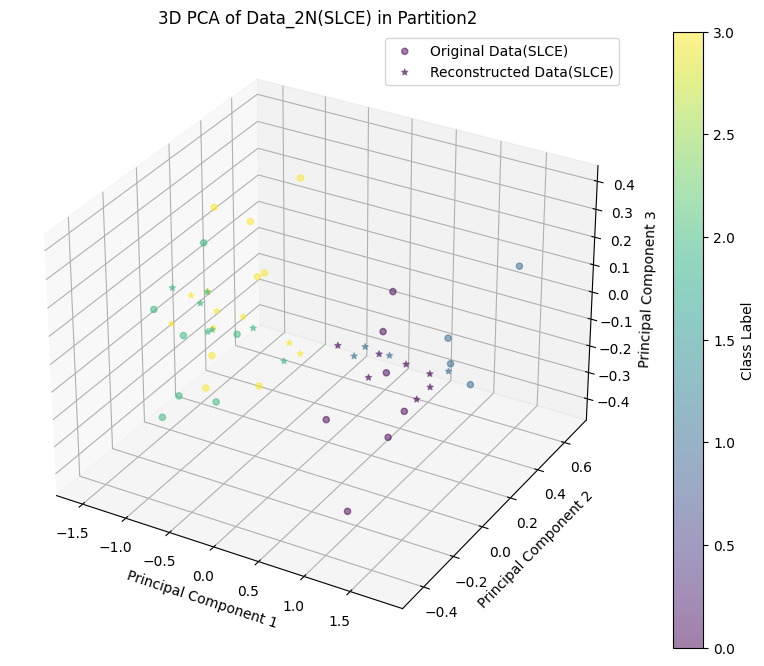

Processing /content/drive/MyDrive/Data/GLIOMA/Partition4/train_data_slce.csv


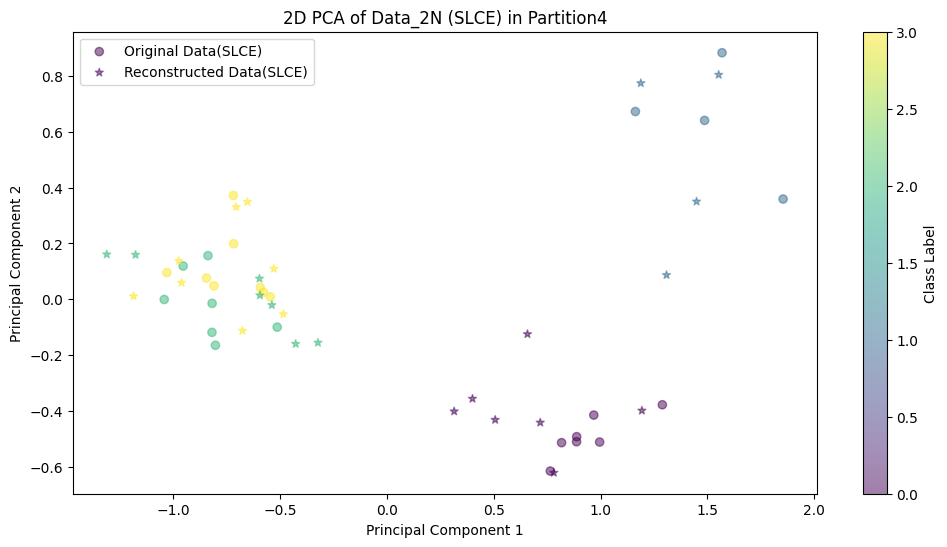

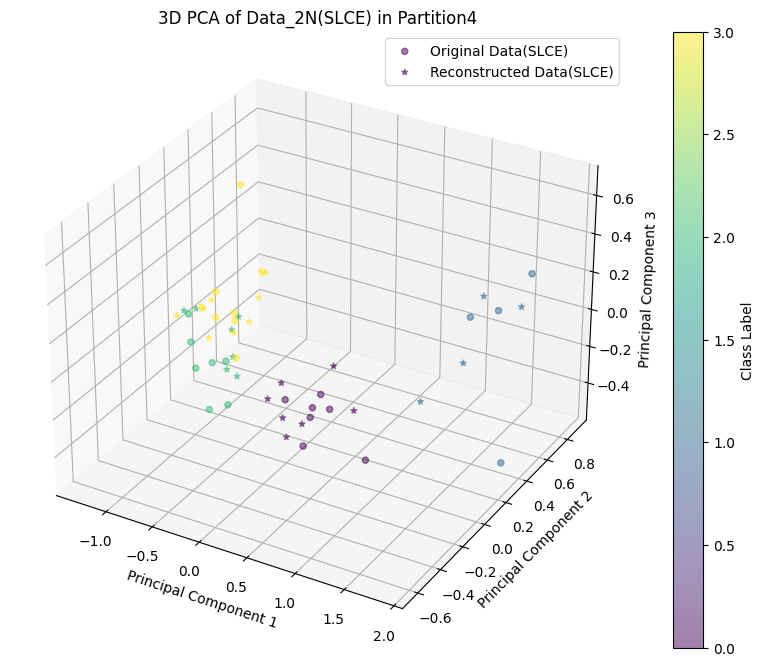

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.nn import functional as F
import torch.utils.data as Data
from mpl_toolkits.mplot3d import Axes3D  # Import necessary for 3D plotting

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class VAE(nn.Module):
    def __init__(self, data_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(data_dim, 400)
        self.fc21 = nn.Linear(400, 20)  # Latent space dimension can be adjusted
        self.fc22 = nn.Linear(400, 20)
        self.fc3 = nn.Linear(20, 400)
        self.fc4 = nn.Linear(400, data_dim)

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return self.fc4(h3)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    MSE = F.mse_loss(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return MSE + KLD

def process_data(file_path):
    data = np.loadtxt(file_path, delimiter=',', skiprows=1)
    X = data[:, :-1]  # Features
    y = data[:, -1]   # Labels
    data_dim = X.shape[1]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    model = VAE(data_dim).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    tensor_data = torch.tensor(X_scaled, dtype=torch.float32).to(device)
    data_loader = Data.DataLoader(tensor_data, batch_size=256, shuffle=True)

    model.train()
    for epoch in range(50):
        for data in data_loader:
            optimizer.zero_grad()
            reconstructed, mu, logvar = model(data)
            loss = loss_function(reconstructed, data, mu, logvar)
            loss.backward()
            optimizer.step()

    model.eval()
    with torch.no_grad():
        reconstructed, _, _ = model(tensor_data)
        reconstructed = reconstructed.cpu().numpy()

    original_data = scaler.inverse_transform(X_scaled)
    reconstructed_data = scaler.inverse_transform(reconstructed)

    combined_data = np.vstack((original_data, reconstructed_data))
    combined_labels = np.concatenate((y, y))
    output_array = np.hstack((combined_data, combined_labels.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'combined_train_2n_slce.csv'), output_array, delimiter=',')

    # Save only the reconstructed data as augmented_n.csv
    augmented_data = np.hstack((reconstructed_data, y.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'augmented_n_slce.csv'), augmented_data, delimiter=',')

    df_tensor = torch.from_numpy(combined_data).float()
    df_tensor = df_tensor.to(device)

    x = df_tensor[:, :-1]
    y = df_tensor[:, -1].int()

    mean = torch.mean(x, dim=0)
    x_centered = x - mean

    cov_matrix = torch.matmul(x_centered.T, x_centered) / (x_centered.shape[0] - 1)
    eigenvalues, eigenvectors = torch.linalg.eigh(cov_matrix)

    sorted_indices = torch.argsort(eigenvalues, descending=True)
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    pca_components = eigenvectors[:, :3]
    combined_data_pca = torch.matmul(x_centered, pca_components)

    # 2D PCA Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                c=combined_labels[:len(original_data)], marker='o', label='Original Data(SLCE)', alpha=0.5, cmap='viridis')
    plt.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
                c=combined_labels[len(original_data):], marker='*', label='Reconstructed Data(SLCE)', alpha=0.5, cmap='viridis')
    plt.title(f'2D PCA of Data_2N (SLCE) in {os.path.basename(os.path.dirname(file_path))}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Class Label')
    plt.legend()
    plt.show()

    # 3D PCA Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                         combined_data_pca[:len(original_data), 2], c=combined_labels[:len(original_data)],
                         marker='o', label='Original Data(SLCE)', alpha=0.5, cmap='viridis')
    ax.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
               combined_data_pca[len(original_data):, 2], c=combined_labels[len(original_data):],
               marker='*', label='Reconstructed Data(SLCE)', alpha=0.5, cmap='viridis')
    ax.set_title(f'3D PCA of Data_2N(SLCE) in {os.path.basename(os.path.dirname(file_path))}')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    fig.colorbar(scatter, ax=ax, label='Class Label')
    ax.legend()
    plt.show()

root_dir = '/content/drive/MyDrive/Data/GLIOMA'

for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.endswith('train_data_slce.csv'):
            file_path = os.path.join(subdir, file)
            print(f"Processing {file_path}")
            process_data(file_path)


Processing /content/drive/MyDrive/Data/GLIOMA/Partition11/combined_train_2n_slce.csv


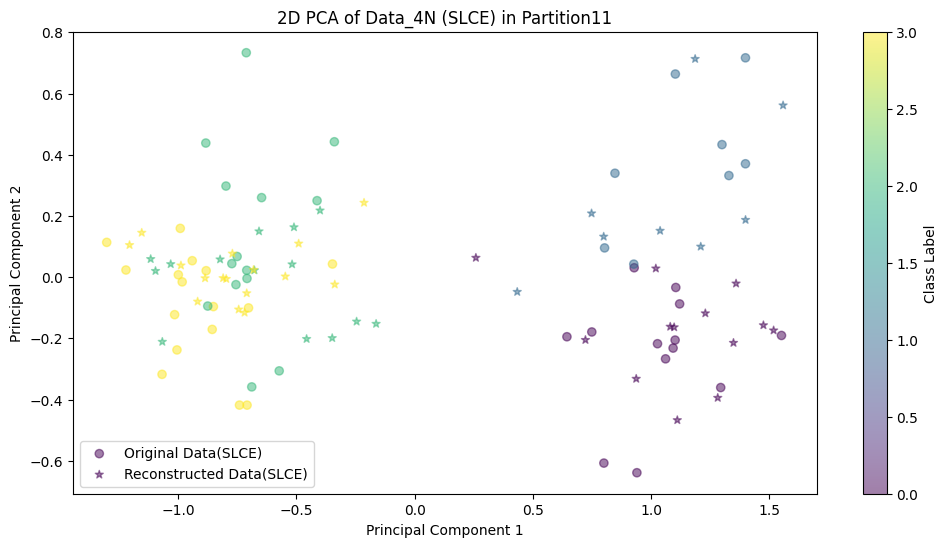

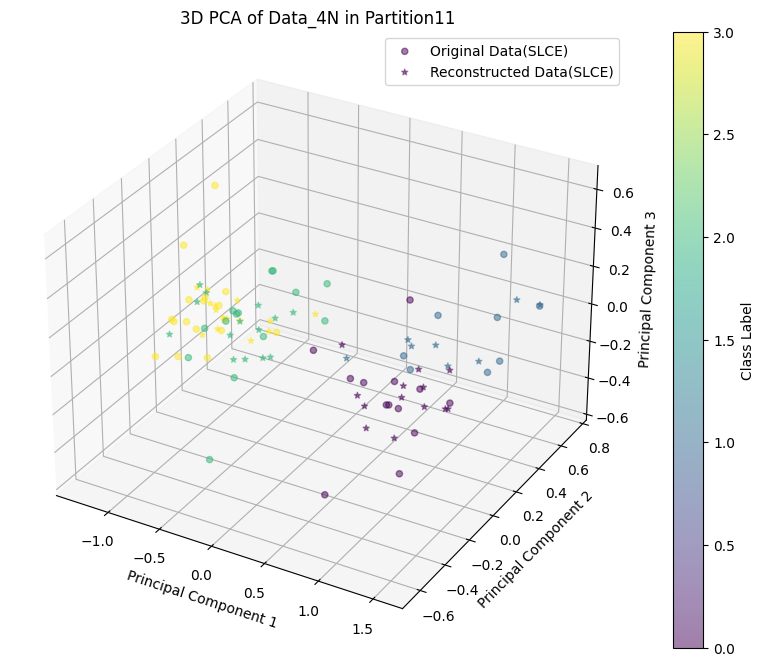

Processing /content/drive/MyDrive/Data/GLIOMA/Partition16/combined_train_2n_slce.csv


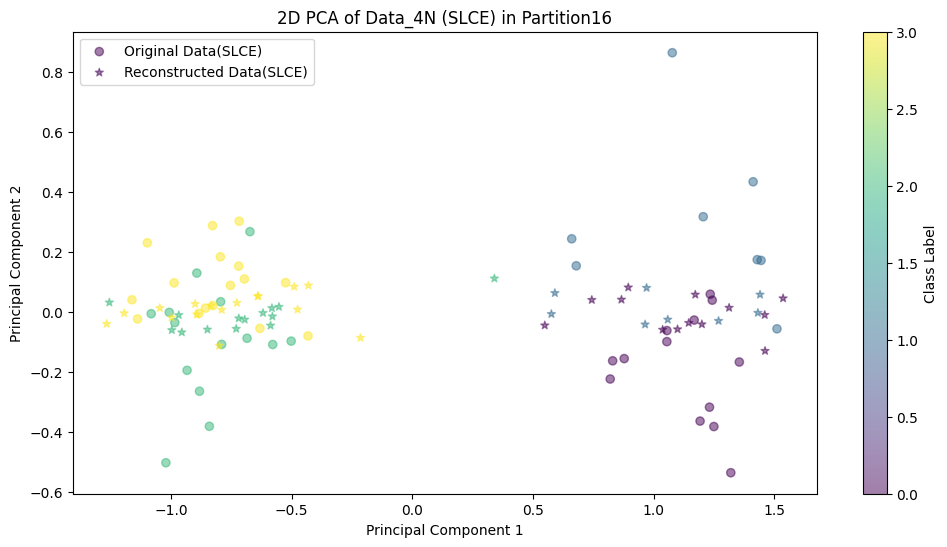

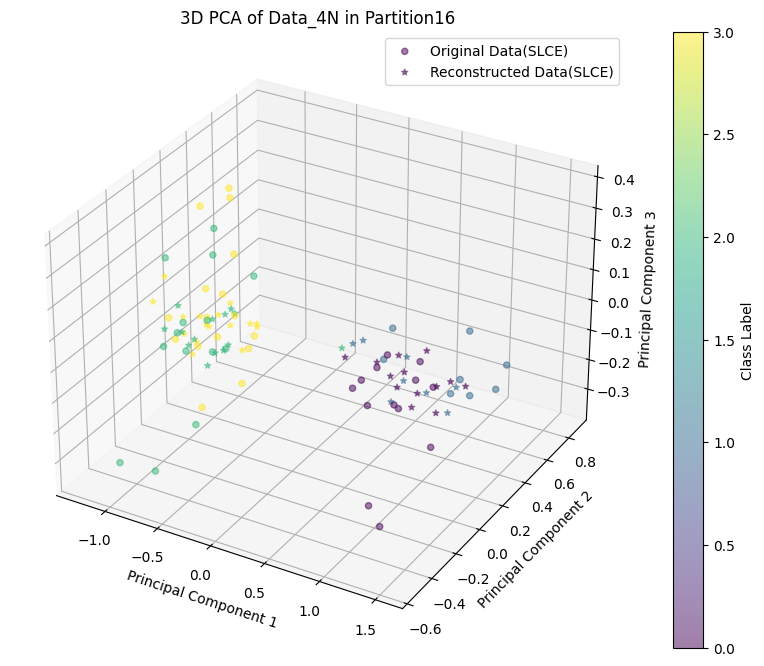

Processing /content/drive/MyDrive/Data/GLIOMA/Partition19/combined_train_2n_slce.csv


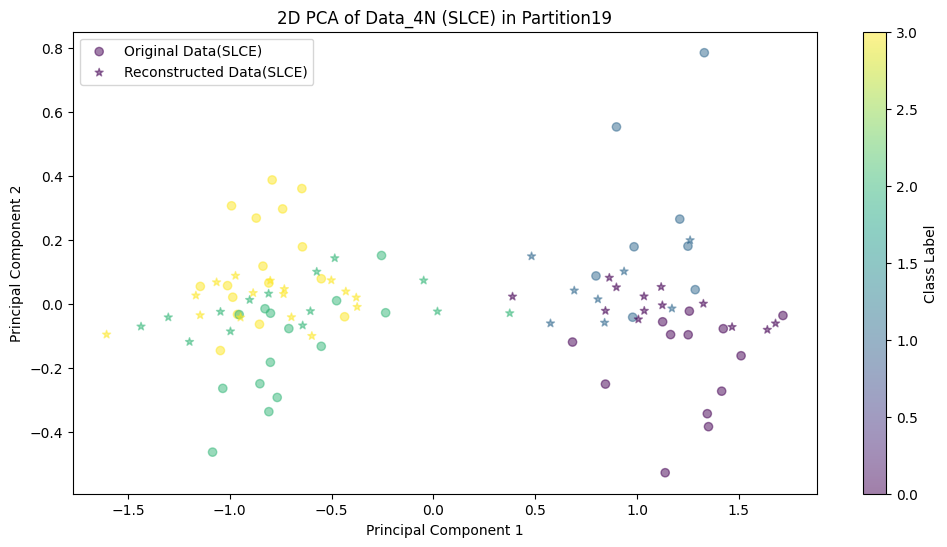

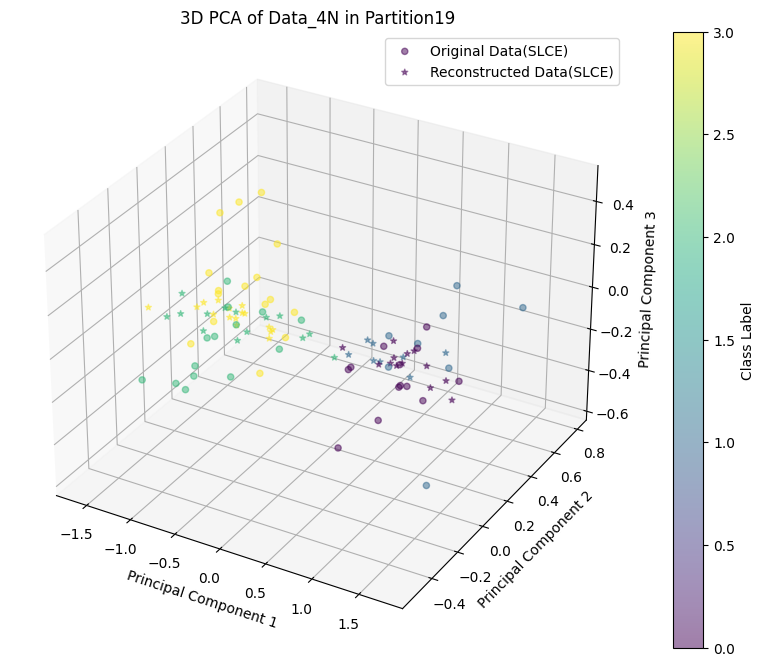

Processing /content/drive/MyDrive/Data/GLIOMA/Partition6/combined_train_2n_slce.csv


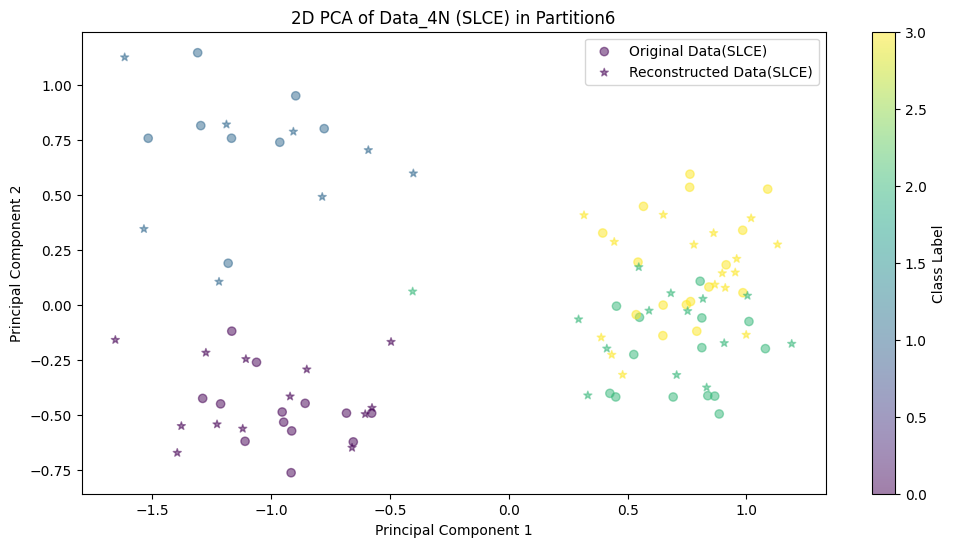

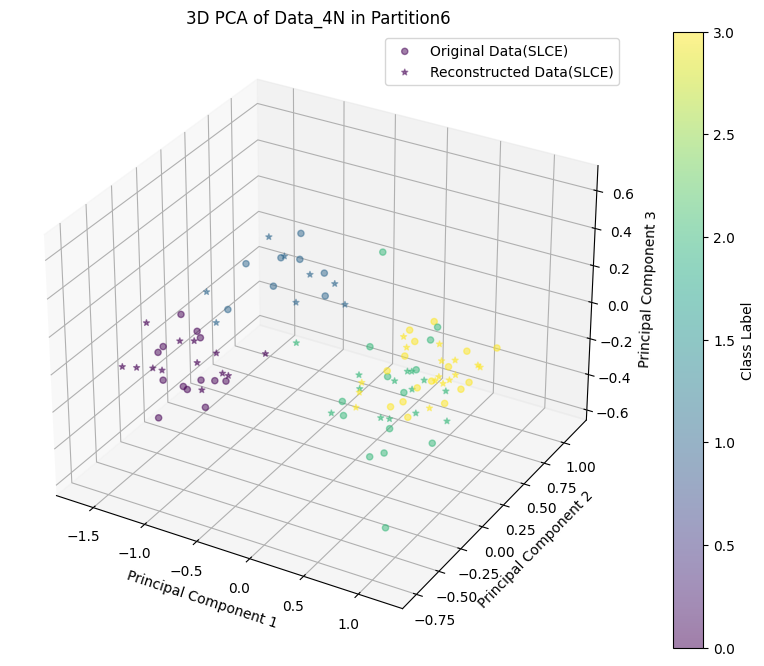

Processing /content/drive/MyDrive/Data/GLIOMA/Partition10/combined_train_2n_slce.csv


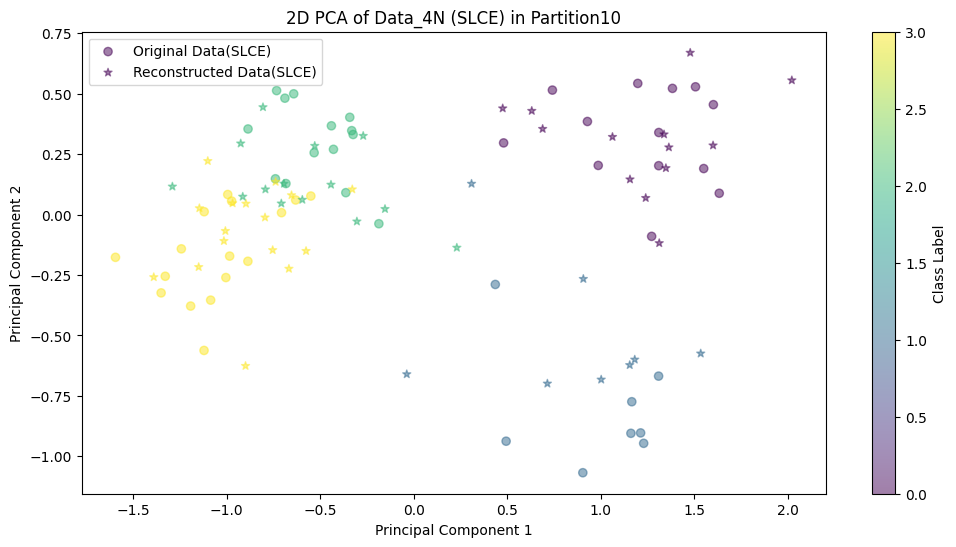

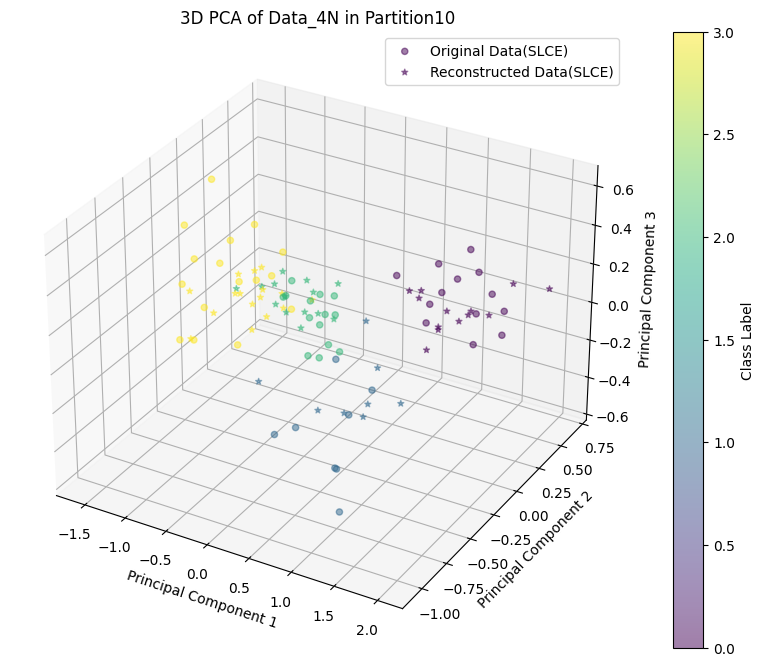

Processing /content/drive/MyDrive/Data/GLIOMA/Partition8/combined_train_2n_slce.csv


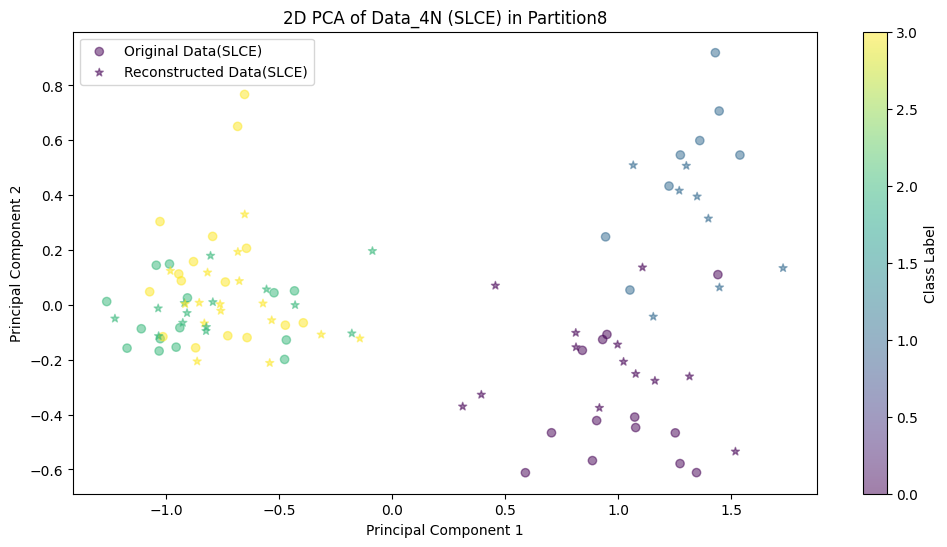

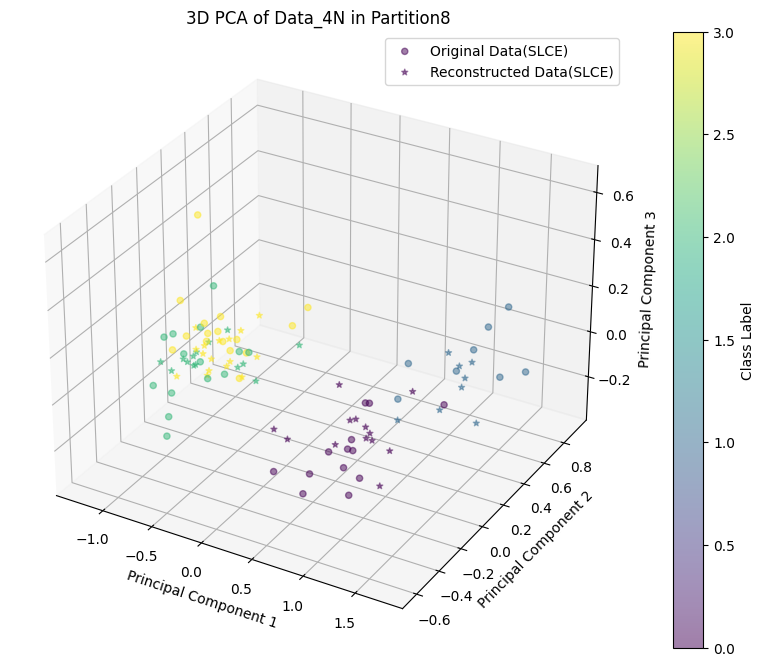

Processing /content/drive/MyDrive/Data/GLIOMA/Partition0/combined_train_2n_slce.csv


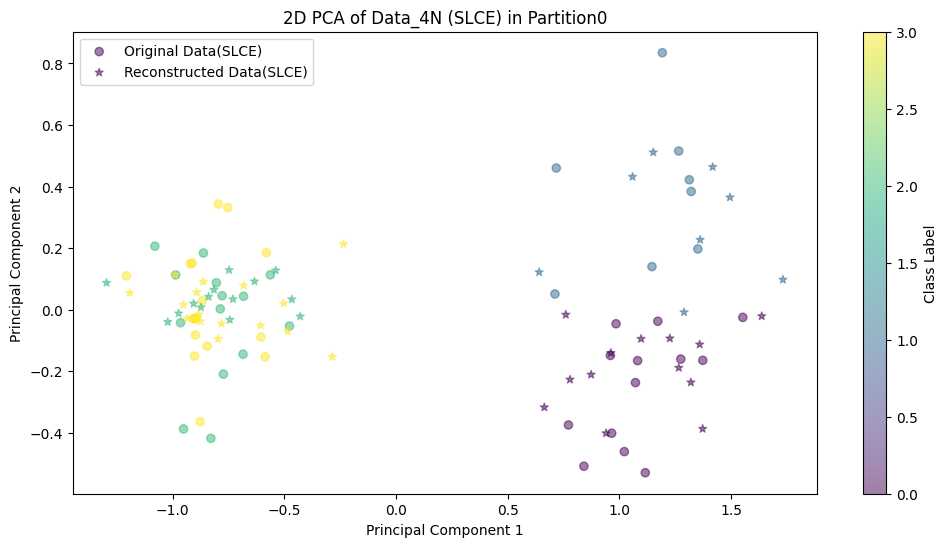

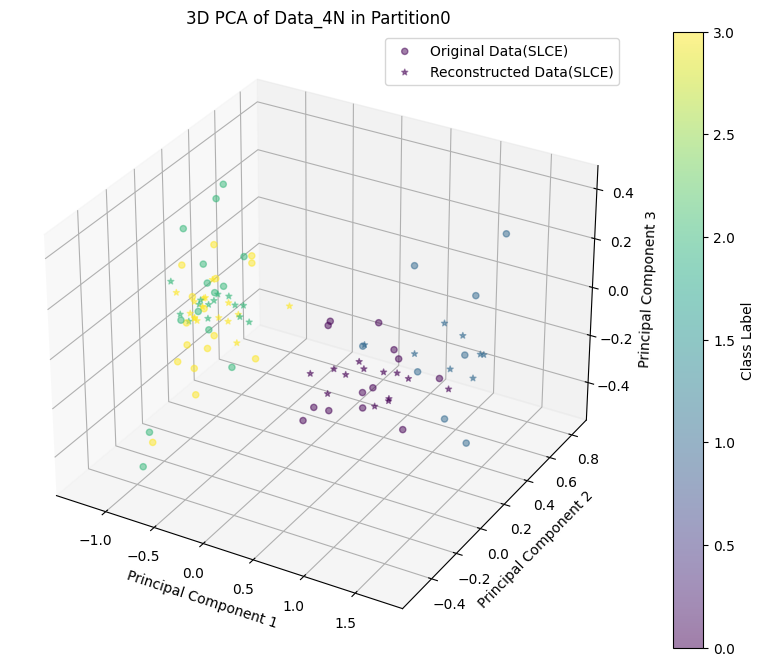

Processing /content/drive/MyDrive/Data/GLIOMA/Partition17/combined_train_2n_slce.csv


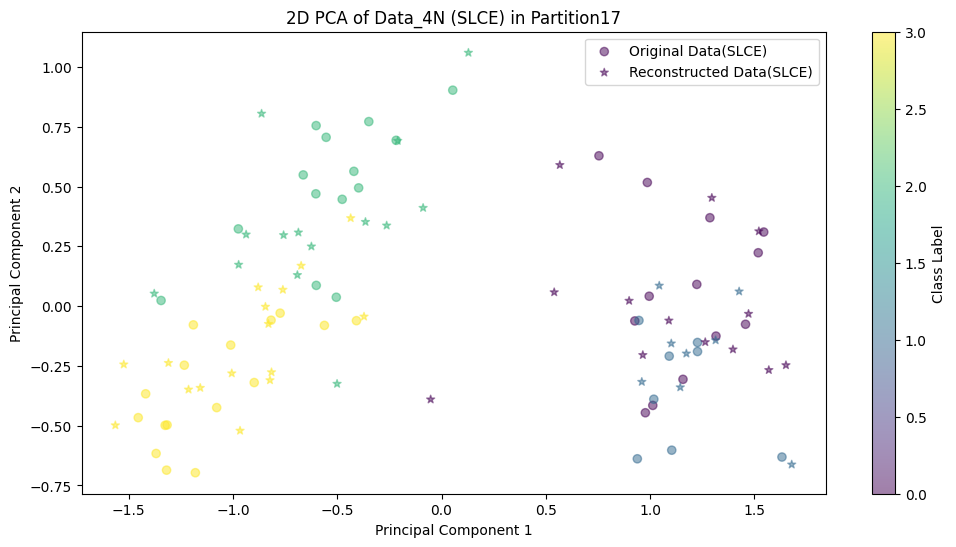

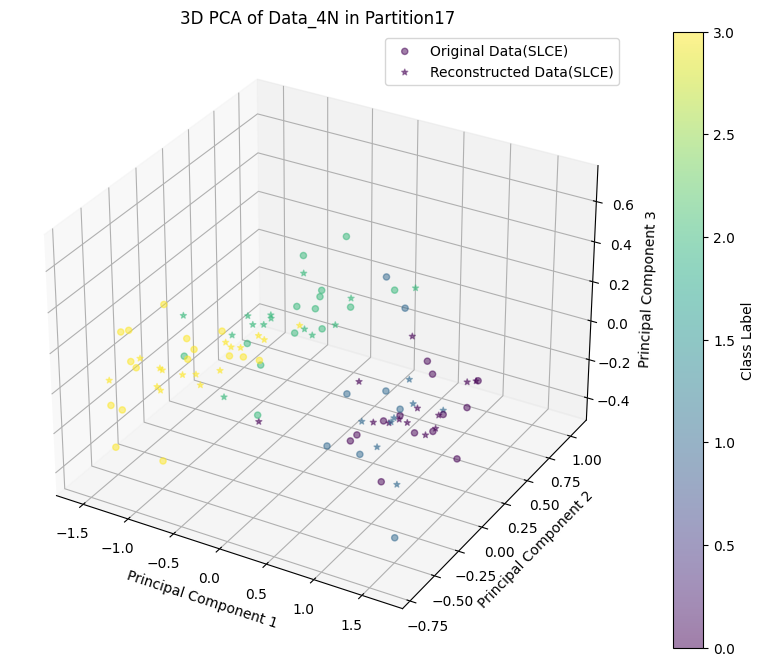

Processing /content/drive/MyDrive/Data/GLIOMA/Partition9/combined_train_2n_slce.csv


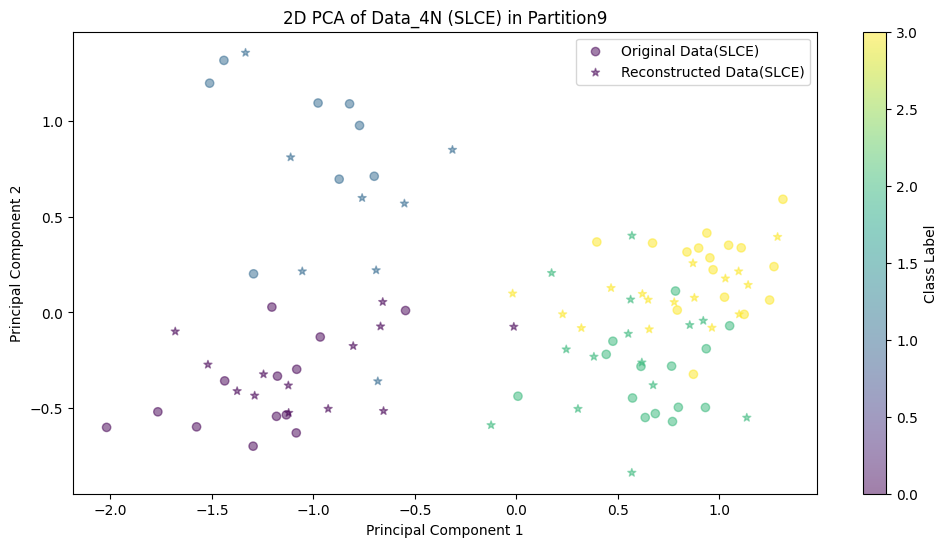

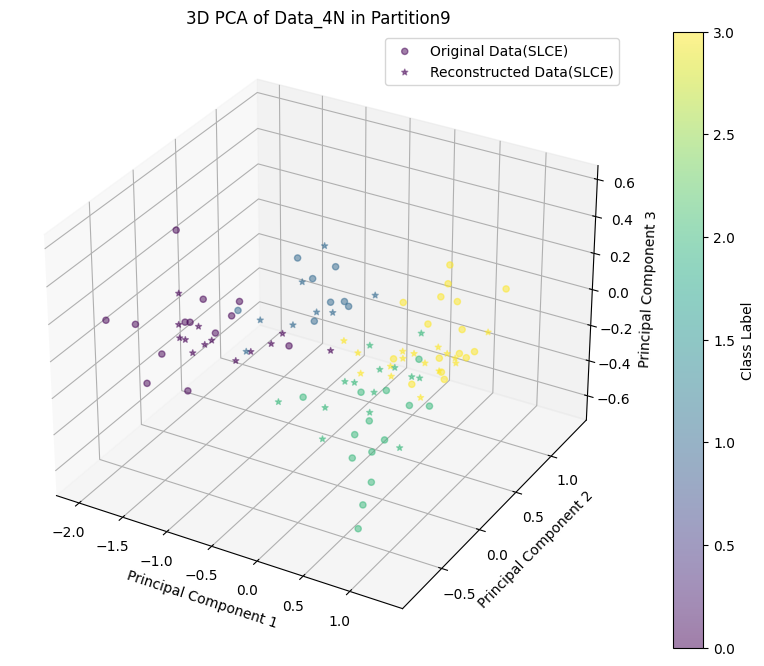

Processing /content/drive/MyDrive/Data/GLIOMA/Partition18/combined_train_2n_slce.csv


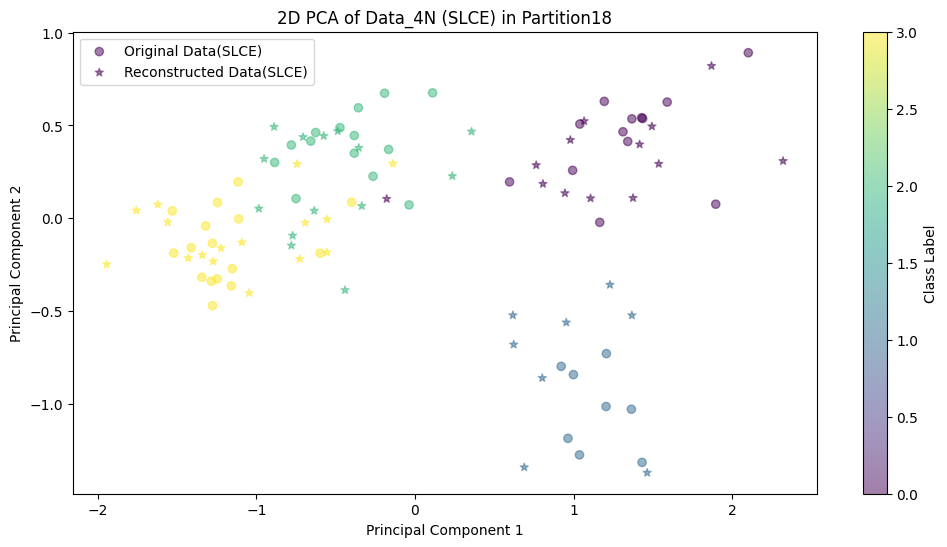

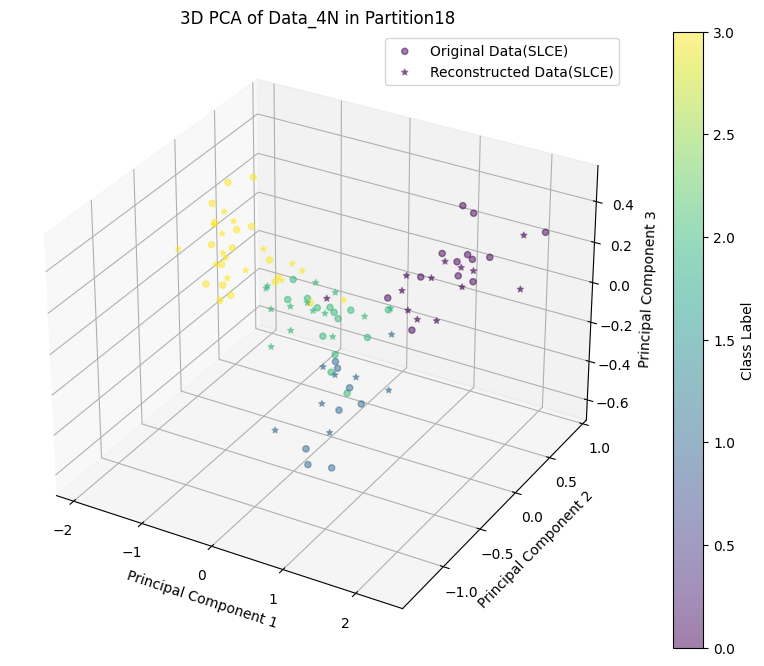

Processing /content/drive/MyDrive/Data/GLIOMA/Partition7/combined_train_2n_slce.csv


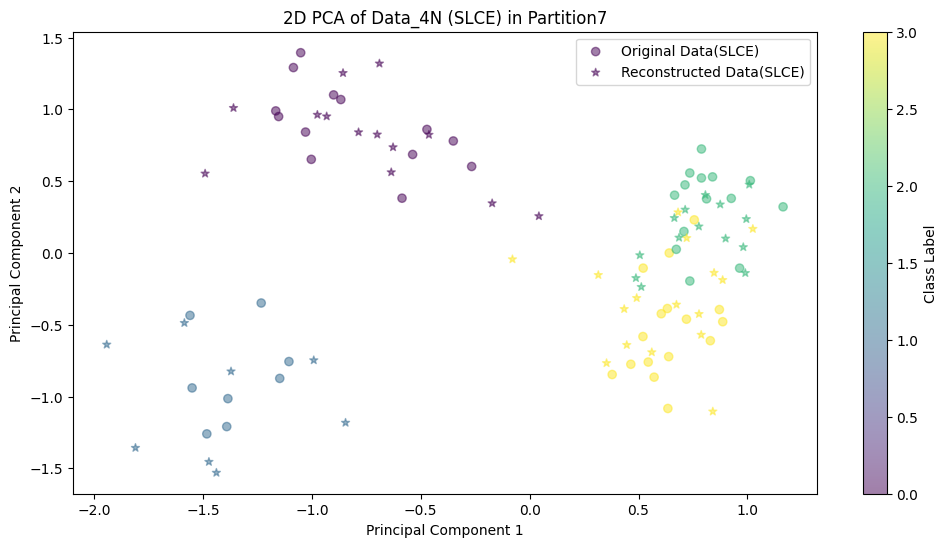

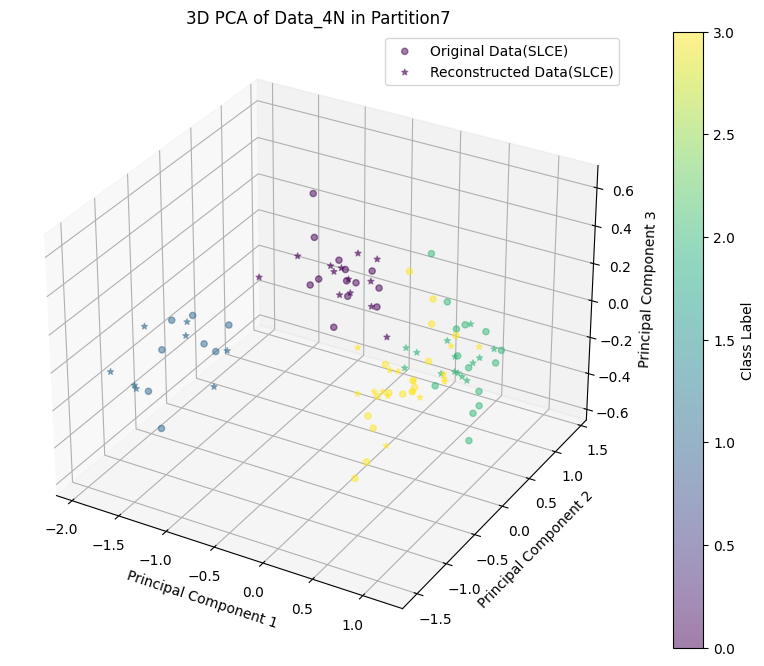

Processing /content/drive/MyDrive/Data/GLIOMA/Partition1/combined_train_2n_slce.csv


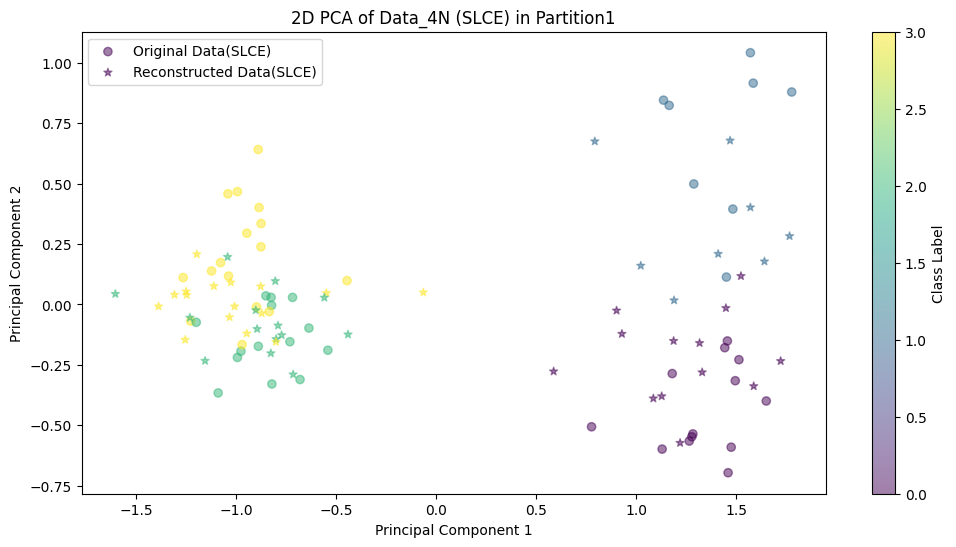

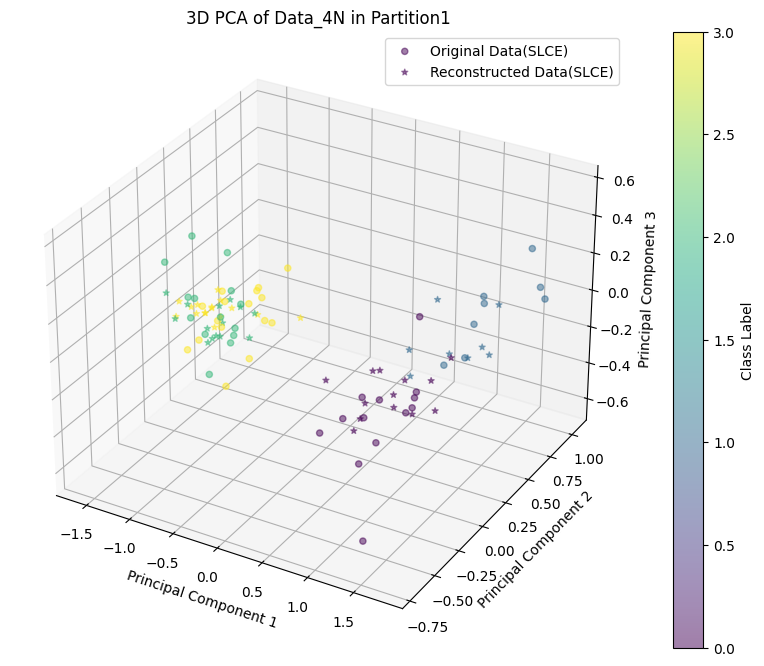

Processing /content/drive/MyDrive/Data/GLIOMA/Partition15/combined_train_2n_slce.csv


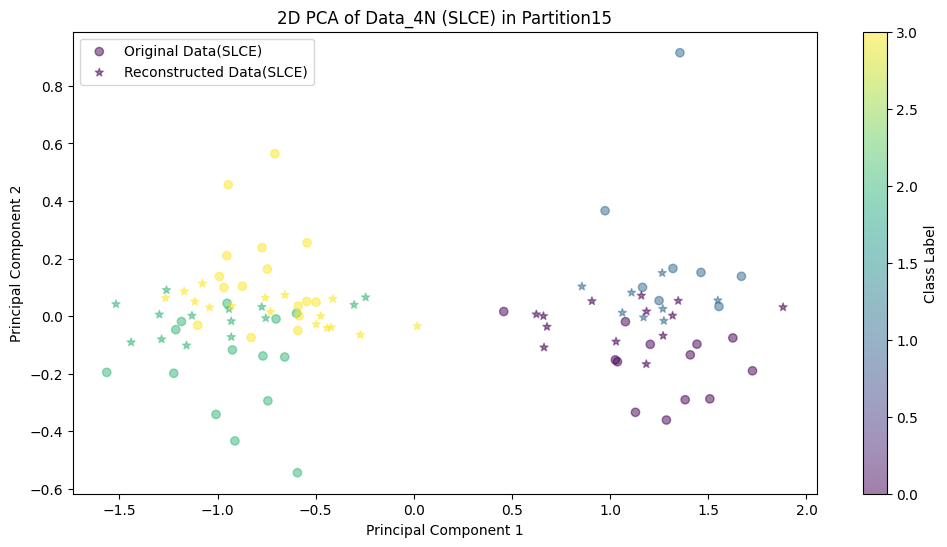

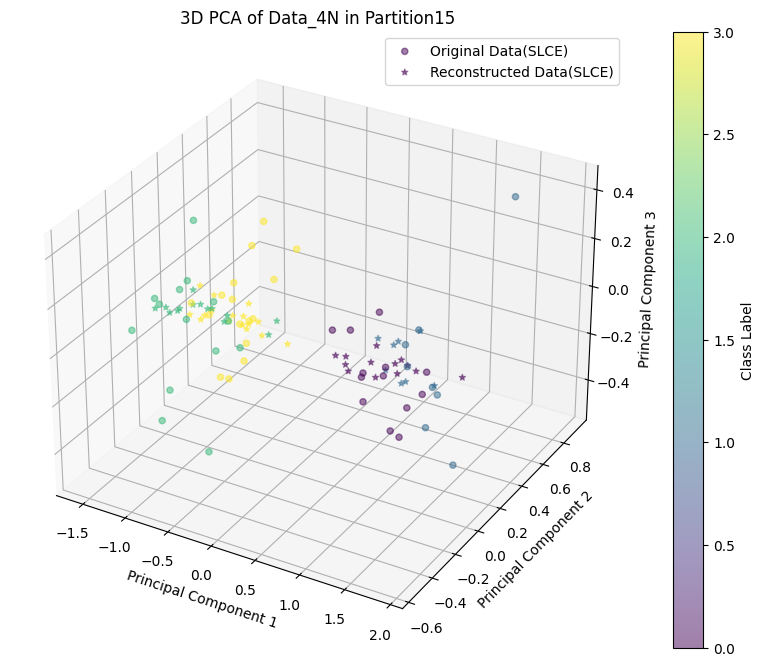

Processing /content/drive/MyDrive/Data/GLIOMA/Partition12/combined_train_2n_slce.csv


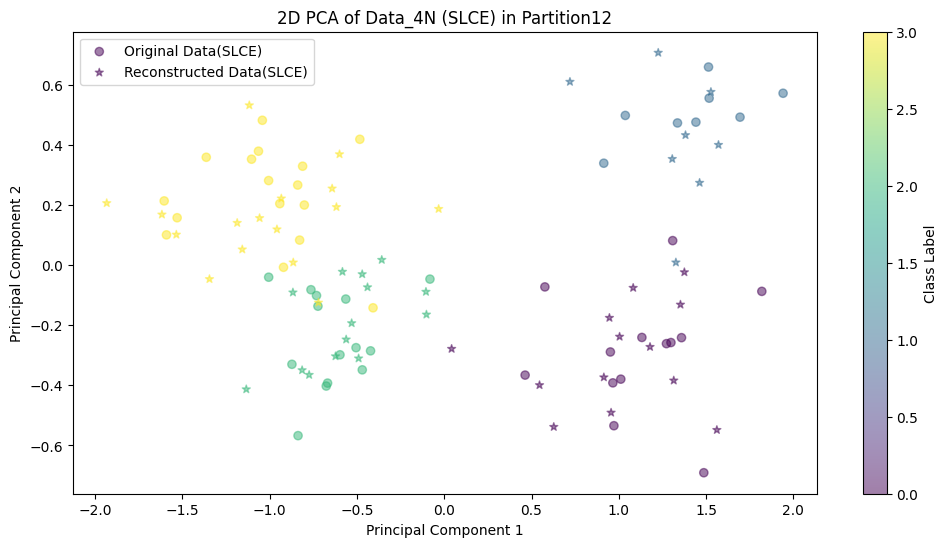

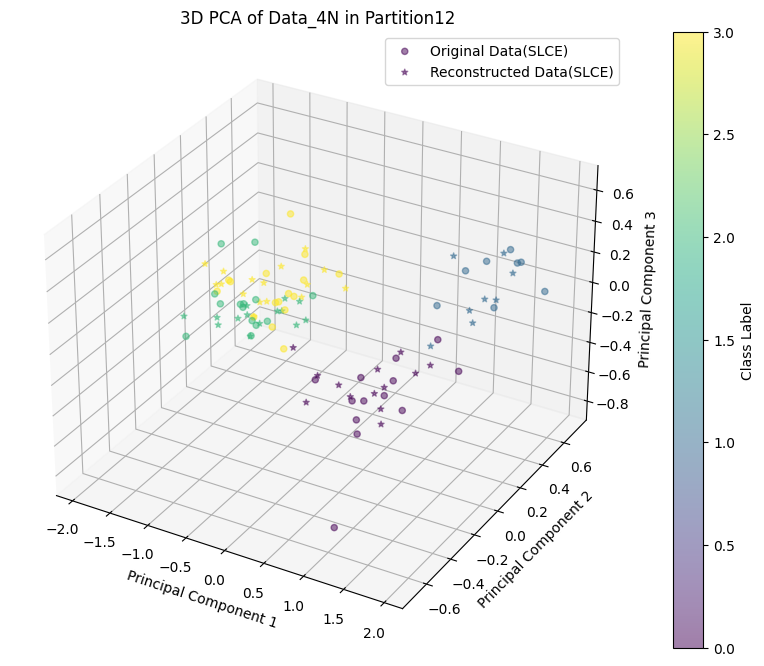

Processing /content/drive/MyDrive/Data/GLIOMA/Partition13/combined_train_2n_slce.csv


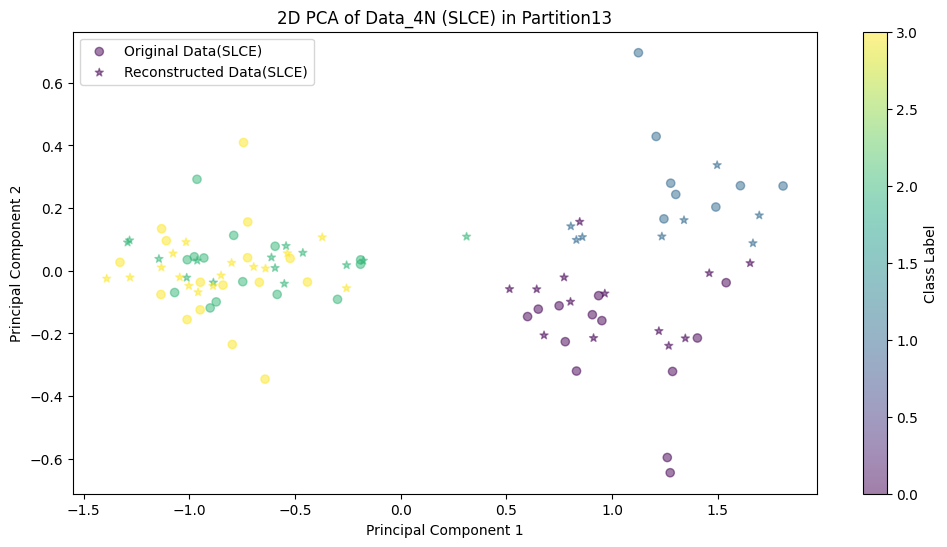

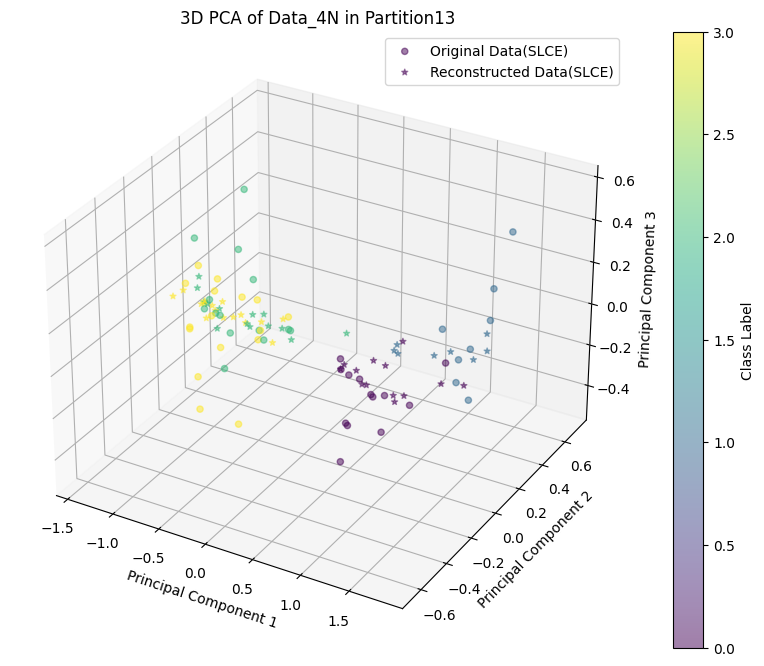

Processing /content/drive/MyDrive/Data/GLIOMA/Partition14/combined_train_2n_slce.csv


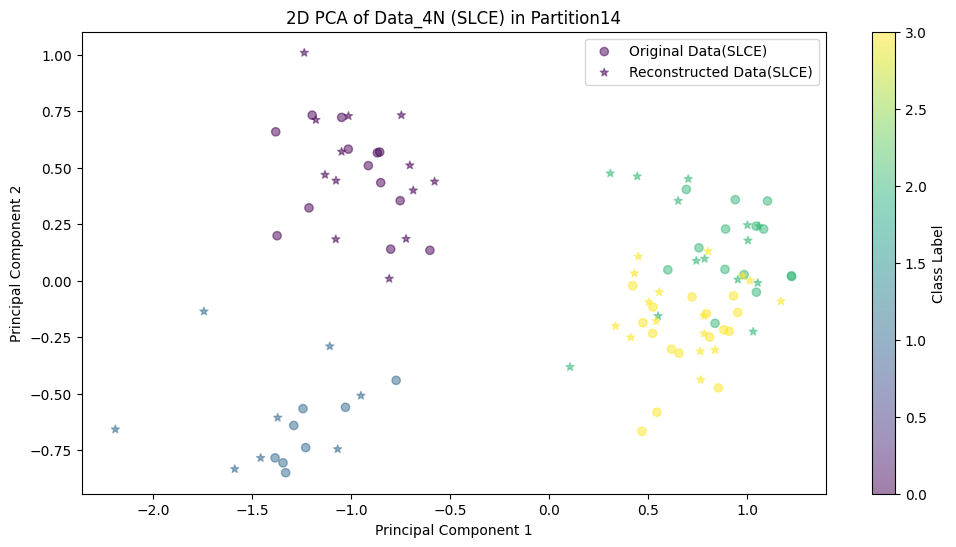

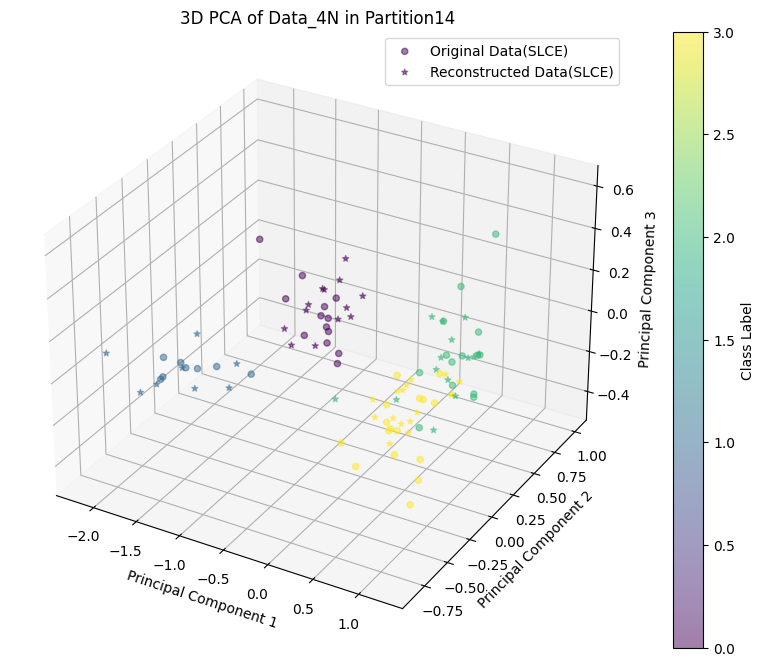

Processing /content/drive/MyDrive/Data/GLIOMA/Partition5/combined_train_2n_slce.csv


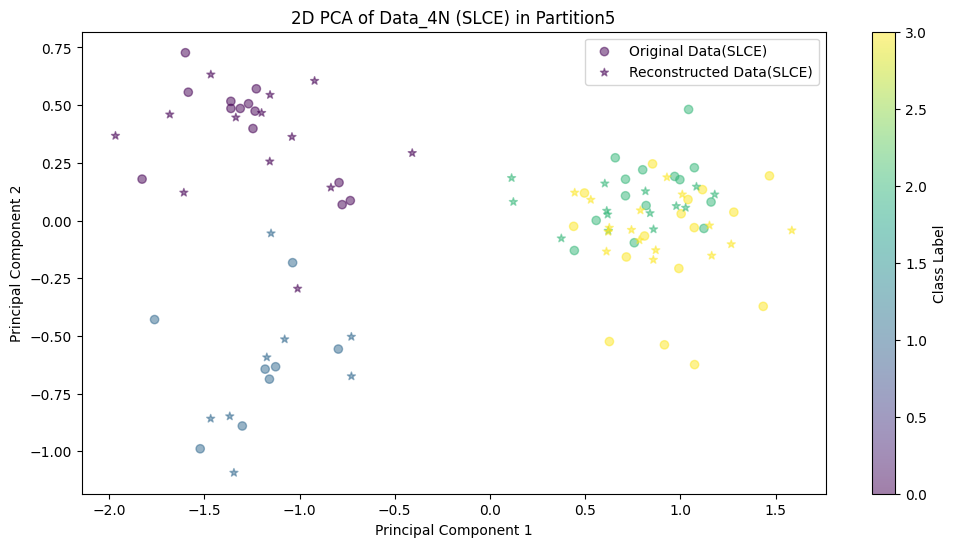

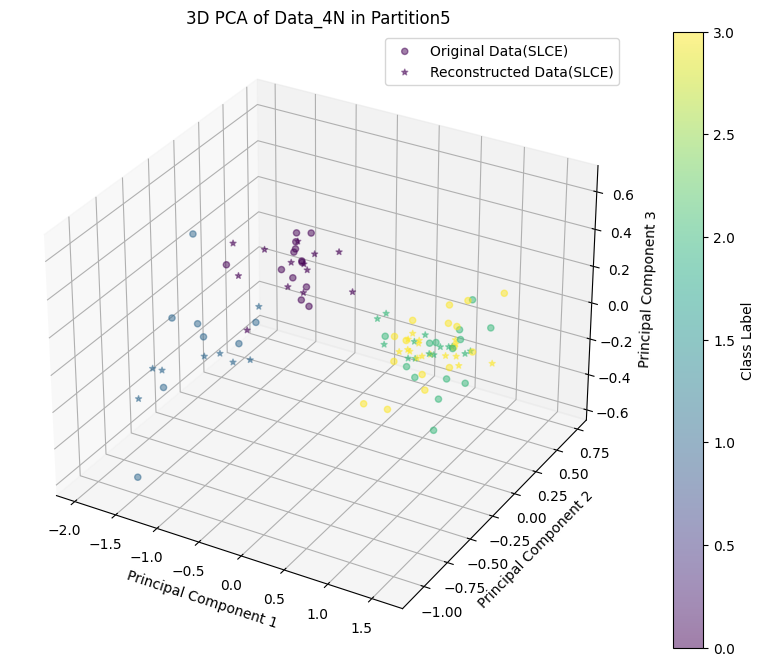

Processing /content/drive/MyDrive/Data/GLIOMA/Partition3/combined_train_2n_slce.csv


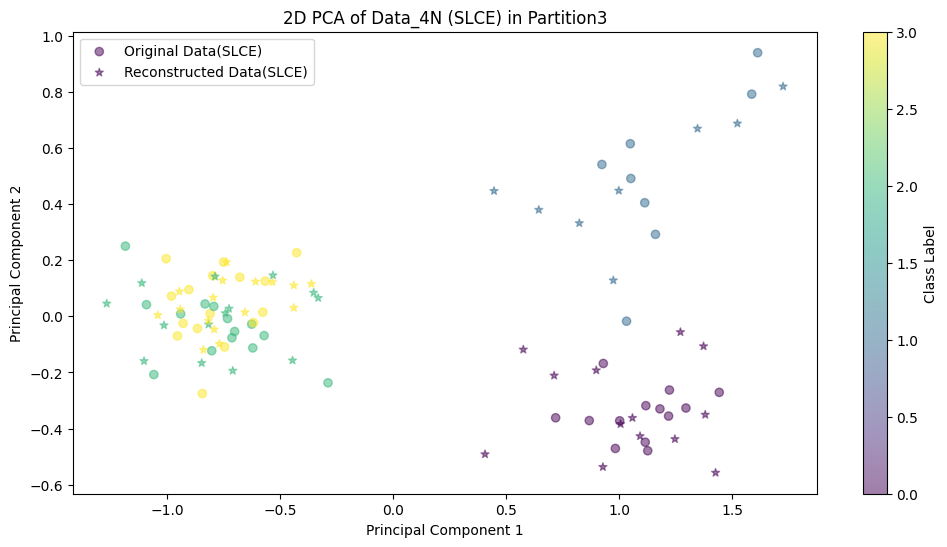

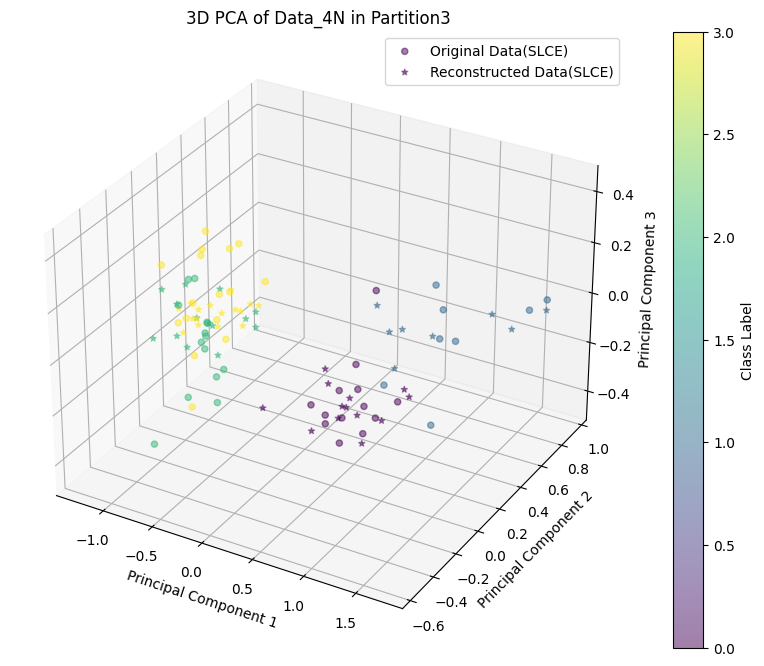

Processing /content/drive/MyDrive/Data/GLIOMA/Partition2/combined_train_2n_slce.csv


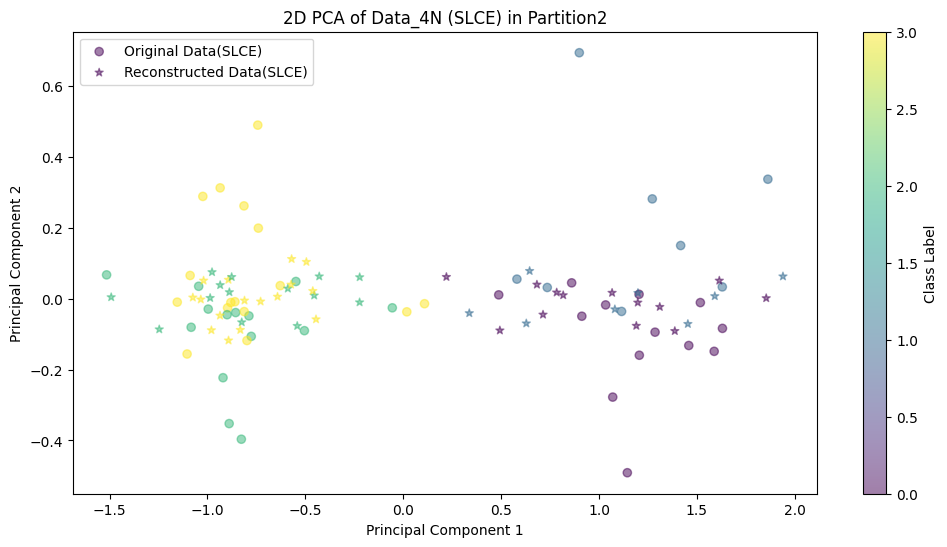

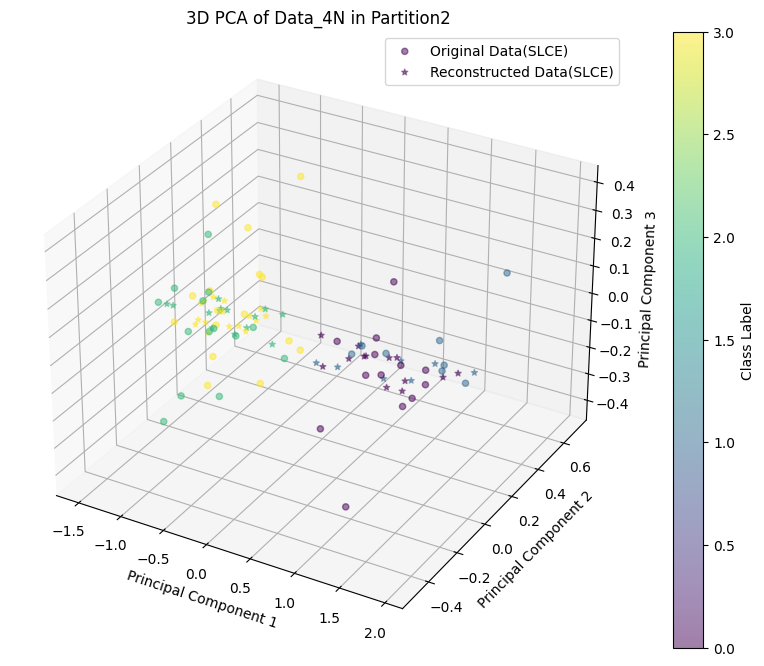

Processing /content/drive/MyDrive/Data/GLIOMA/Partition4/combined_train_2n_slce.csv


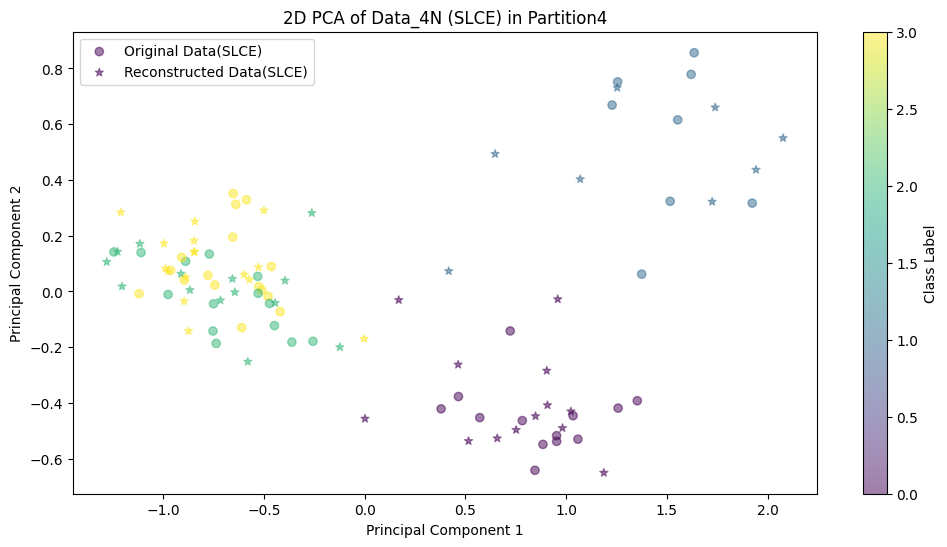

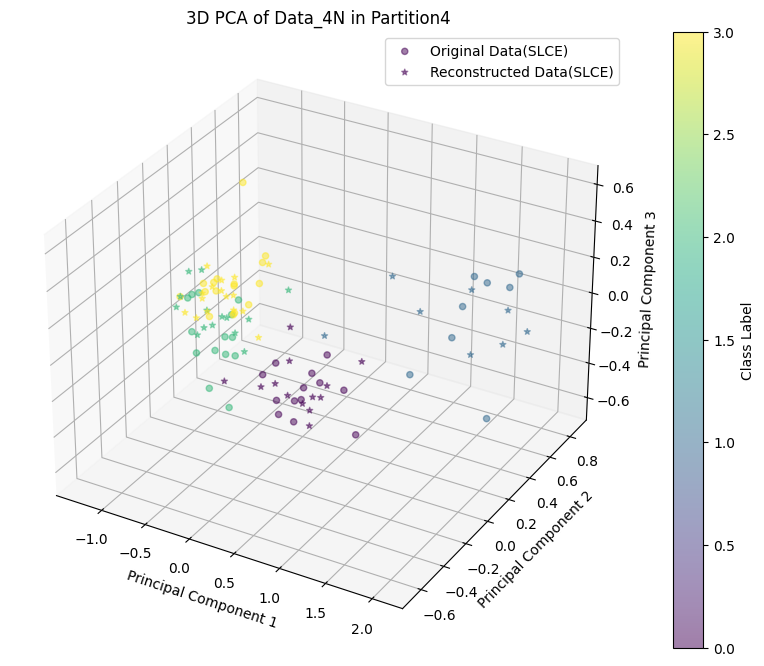

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.nn import functional as F
import torch.utils.data as Data
from mpl_toolkits.mplot3d import Axes3D  # Import necessary for 3D plotting

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class VAE(nn.Module):
    def __init__(self, data_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(data_dim, 400)
        self.fc21 = nn.Linear(400, 20)  # Latent space dimension can be adjusted
        self.fc22 = nn.Linear(400, 20)
        self.fc3 = nn.Linear(20, 400)
        self.fc4 = nn.Linear(400, data_dim)

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return self.fc4(h3)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    MSE = F.mse_loss(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return MSE + KLD

def process_data(file_path):
    data = np.loadtxt(file_path, delimiter=',', skiprows=1)
    X = data[:, :-1]  # Features
    y = data[:, -1]   # Labels
    data_dim = X.shape[1]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    model = VAE(data_dim).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    tensor_data = torch.tensor(X_scaled, dtype=torch.float32).to(device)
    data_loader = Data.DataLoader(tensor_data, batch_size=256, shuffle=True)

    model.train()
    for epoch in range(50):
        for data in data_loader:
            optimizer.zero_grad()
            reconstructed, mu, logvar = model(data)
            loss = loss_function(reconstructed, data, mu, logvar)
            loss.backward()
            optimizer.step()

    model.eval()
    with torch.no_grad():
        reconstructed, _, _ = model(tensor_data)
        reconstructed = reconstructed.cpu().numpy()

    original_data = scaler.inverse_transform(X_scaled)
    reconstructed_data = scaler.inverse_transform(reconstructed)

    combined_data = np.vstack((original_data, reconstructed_data))
    combined_labels = np.concatenate((y, y))
    output_array = np.hstack((combined_data, combined_labels.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'combined_train_4n_slce.csv'), output_array, delimiter=',')

    # Save only the reconstructed data as augmented_n.csv
    augmented_data = np.hstack((reconstructed_data, y.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'augmented_2n_slce.csv'), augmented_data, delimiter=',')

    df_tensor = torch.from_numpy(combined_data).float()
    df_tensor = df_tensor.to(device)

    x = df_tensor[:, :-1]
    y = df_tensor[:, -1].int()

    mean = torch.mean(x, dim=0)
    x_centered = x - mean

    cov_matrix = torch.matmul(x_centered.T, x_centered) / (x_centered.shape[0] - 1)
    eigenvalues, eigenvectors = torch.linalg.eigh(cov_matrix)

    sorted_indices = torch.argsort(eigenvalues, descending=True)
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    pca_components = eigenvectors[:, :3]
    combined_data_pca = torch.matmul(x_centered, pca_components)

    # 2D PCA Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                c=combined_labels[:len(original_data)], marker='o', label='Original Data(SLCE)', alpha=0.5, cmap='viridis')
    plt.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
                c=combined_labels[len(original_data):], marker='*', label='Reconstructed Data(SLCE)', alpha=0.5, cmap='viridis')
    plt.title(f'2D PCA of Data_4N (SLCE) in {os.path.basename(os.path.dirname(file_path))}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Class Label')
    plt.legend()
    plt.show()

    # 3D PCA Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                         combined_data_pca[:len(original_data), 2], c=combined_labels[:len(original_data)],
                         marker='o', label='Original Data(SLCE)', alpha=0.5, cmap='viridis')
    ax.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
               combined_data_pca[len(original_data):, 2], c=combined_labels[len(original_data):],
               marker='*', label='Reconstructed Data(SLCE)', alpha=0.5, cmap='viridis')
    ax.set_title(f'3D PCA of Data_4N in {os.path.basename(os.path.dirname(file_path))}')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    fig.colorbar(scatter, ax=ax, label='Class Label')
    ax.legend()
    plt.show()

root_dir = '/content/drive/MyDrive/Data/GLIOMA'

for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.endswith('combined_train_2n_slce.csv'):
            file_path = os.path.join(subdir, file)
            print(f"Processing {file_path}")
            process_data(file_path)


In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'combined_train_2n_slce.csv')
            test_file_path = os.path.join(full_path, 'test_data_slce.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Combined 2n SLCE: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy Combined 2n SLCE: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/GLIOMA'
    main(folder_path)


Partition 0: RF Accuracy = 0.7500, KNN Accuracy = 0.5833
Partition 1: RF Accuracy = 0.7917, KNN Accuracy = 0.7500
Partition 2: RF Accuracy = 0.7083, KNN Accuracy = 0.7917
Partition 3: RF Accuracy = 0.5417, KNN Accuracy = 0.4583
Partition 4: RF Accuracy = 0.7500, KNN Accuracy = 0.6667
Partition 5: RF Accuracy = 0.7500, KNN Accuracy = 0.4583
Partition 6: RF Accuracy = 0.5417, KNN Accuracy = 0.6667
Partition 7: RF Accuracy = 0.8333, KNN Accuracy = 0.7500
Partition 8: RF Accuracy = 0.5417, KNN Accuracy = 0.7083
Partition 9: RF Accuracy = 0.7083, KNN Accuracy = 0.7083
Partition 10: RF Accuracy = 0.5417, KNN Accuracy = 0.5833
Partition 11: RF Accuracy = 0.7500, KNN Accuracy = 0.7917
Partition 12: RF Accuracy = 0.7917, KNN Accuracy = 0.6250
Partition 13: RF Accuracy = 0.7500, KNN Accuracy = 0.5833
Partition 14: RF Accuracy = 0.5417, KNN Accuracy = 0.5000
Partition 15: RF Accuracy = 0.9167, KNN Accuracy = 0.7917
Partition 16: RF Accuracy = 0.6667, KNN Accuracy = 0.7500
Partition 17: RF Accurac

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'combined_train_4n_slce.csv')
            test_file_path = os.path.join(full_path, 'test_data_slce.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Combined 4n SLCE: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy Combined 4n SLCE: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/GLIOMA'
    main(folder_path)


Partition 0: RF Accuracy = 0.6250, KNN Accuracy = 0.5417
Partition 1: RF Accuracy = 0.7083, KNN Accuracy = 0.7500
Partition 2: RF Accuracy = 0.7083, KNN Accuracy = 0.7500
Partition 3: RF Accuracy = 0.5417, KNN Accuracy = 0.4583
Partition 4: RF Accuracy = 0.7917, KNN Accuracy = 0.7083
Partition 5: RF Accuracy = 0.7083, KNN Accuracy = 0.5417
Partition 6: RF Accuracy = 0.5833, KNN Accuracy = 0.6667
Partition 7: RF Accuracy = 0.8333, KNN Accuracy = 0.7083
Partition 8: RF Accuracy = 0.4583, KNN Accuracy = 0.4583
Partition 9: RF Accuracy = 0.6667, KNN Accuracy = 0.5417
Partition 10: RF Accuracy = 0.5417, KNN Accuracy = 0.6250
Partition 11: RF Accuracy = 0.7083, KNN Accuracy = 0.7083
Partition 12: RF Accuracy = 0.7083, KNN Accuracy = 0.3750
Partition 13: RF Accuracy = 0.7500, KNN Accuracy = 0.5417
Partition 14: RF Accuracy = 0.5833, KNN Accuracy = 0.5417
Partition 15: RF Accuracy = 0.8750, KNN Accuracy = 0.7917
Partition 16: RF Accuracy = 0.7500, KNN Accuracy = 0.7083
Partition 17: RF Accurac

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'train_data_slce.csv')
            test_file_path = os.path.join(full_path, 'test_data_slce.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Original Train Data: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Original Train Data: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/GLIOMA'
    main(folder_path)


Partition 0: RF Accuracy = 0.6250, KNN Accuracy = 0.6250
Partition 1: RF Accuracy = 0.7083, KNN Accuracy = 0.6250
Partition 2: RF Accuracy = 0.6250, KNN Accuracy = 0.7083
Partition 3: RF Accuracy = 0.5000, KNN Accuracy = 0.5000
Partition 4: RF Accuracy = 0.7917, KNN Accuracy = 0.7083
Partition 5: RF Accuracy = 0.7083, KNN Accuracy = 0.6667
Partition 6: RF Accuracy = 0.5417, KNN Accuracy = 0.6667
Partition 7: RF Accuracy = 0.8333, KNN Accuracy = 0.7917
Partition 8: RF Accuracy = 0.5417, KNN Accuracy = 0.7083
Partition 9: RF Accuracy = 0.6667, KNN Accuracy = 0.5417
Partition 10: RF Accuracy = 0.6250, KNN Accuracy = 0.6250
Partition 11: RF Accuracy = 0.6667, KNN Accuracy = 0.8333
Partition 12: RF Accuracy = 0.7500, KNN Accuracy = 0.7917
Partition 13: RF Accuracy = 0.7500, KNN Accuracy = 0.8750
Partition 14: RF Accuracy = 0.5417, KNN Accuracy = 0.5417
Partition 15: RF Accuracy = 0.7917, KNN Accuracy = 0.7917
Partition 16: RF Accuracy = 0.6667, KNN Accuracy = 0.7500
Partition 17: RF Accurac

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'augmented_2n_slce.csv')
            test_file_path = os.path.join(full_path, 'test_data_slce.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Augmented 2n SLCE: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Augmented 2n SLCE: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/GLIOMA'
    main(folder_path)


Partition 0: RF Accuracy = 0.7917, KNN Accuracy = 0.5417
Partition 1: RF Accuracy = 0.7083, KNN Accuracy = 0.6667
Partition 2: RF Accuracy = 0.7083, KNN Accuracy = 0.6667
Partition 3: RF Accuracy = 0.5417, KNN Accuracy = 0.3750
Partition 4: RF Accuracy = 0.7083, KNN Accuracy = 0.7083
Partition 5: RF Accuracy = 0.5833, KNN Accuracy = 0.5000
Partition 6: RF Accuracy = 0.6250, KNN Accuracy = 0.6250
Partition 7: RF Accuracy = 0.7500, KNN Accuracy = 0.6667
Partition 8: RF Accuracy = 0.5417, KNN Accuracy = 0.4167
Partition 9: RF Accuracy = 0.7500, KNN Accuracy = 0.5833
Partition 10: RF Accuracy = 0.5000, KNN Accuracy = 0.6250
Partition 11: RF Accuracy = 0.5833, KNN Accuracy = 0.6667
Partition 12: RF Accuracy = 0.5833, KNN Accuracy = 0.3750
Partition 13: RF Accuracy = 0.6250, KNN Accuracy = 0.6250
Partition 14: RF Accuracy = 0.5417, KNN Accuracy = 0.5000
Partition 15: RF Accuracy = 0.7500, KNN Accuracy = 0.7917
Partition 16: RF Accuracy = 0.7500, KNN Accuracy = 0.7500
Partition 17: RF Accurac

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'augmented_n_slce.csv')
            test_file_path = os.path.join(full_path, 'test_data_slce.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Augmented n SLCE: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Augmented n SLCE: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/GLIOMA'
    main(folder_path)


Partition 0: RF Accuracy = 0.5833, KNN Accuracy = 0.6250
Partition 1: RF Accuracy = 0.7500, KNN Accuracy = 0.7917
Partition 2: RF Accuracy = 0.7083, KNN Accuracy = 0.8333
Partition 3: RF Accuracy = 0.5417, KNN Accuracy = 0.4583
Partition 4: RF Accuracy = 0.6667, KNN Accuracy = 0.6667
Partition 5: RF Accuracy = 0.5000, KNN Accuracy = 0.4583
Partition 6: RF Accuracy = 0.6667, KNN Accuracy = 0.6250
Partition 7: RF Accuracy = 0.7500, KNN Accuracy = 0.6250
Partition 8: RF Accuracy = 0.4167, KNN Accuracy = 0.5833
Partition 9: RF Accuracy = 0.7500, KNN Accuracy = 0.6667
Partition 10: RF Accuracy = 0.5833, KNN Accuracy = 0.5833
Partition 11: RF Accuracy = 0.7083, KNN Accuracy = 0.7500
Partition 12: RF Accuracy = 0.6667, KNN Accuracy = 0.4583
Partition 13: RF Accuracy = 0.7917, KNN Accuracy = 0.6667
Partition 14: RF Accuracy = 0.3750, KNN Accuracy = 0.5000
Partition 15: RF Accuracy = 0.6667, KNN Accuracy = 0.7917
Partition 16: RF Accuracy = 0.5417, KNN Accuracy = 0.6667
Partition 17: RF Accurac